# matplotlibでのプロット

## ファイル情報



# import, 読みこみ

In [2]:
import numpy as np
import cdflib
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MultipleLocator, MaxNLocator, FormatStrFormatter
from matplotlib.dates import SecondLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.ndimage import median_filter
from scipy.stats import zscore
from scipy.optimize import fsolve
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize
import datetime as dt
import matplotlib.ticker as mticker


# CDFファイルのパス
file_path_1 = "/home/kinno-7010/Research/Radio data/HF_plot/Rawdata/it_h1_hf_20220613_v01.cdf"

# CDFファイルを読み込み
cdf_file = cdflib.CDF(file_path_1)

# データの読み込み
epoch = cdf_file.varget('Epoch')  # 時間
frequency = cdf_file.varget('Frequency')  # 周波数
lh_data = cdf_file.varget('RH')  # パワーフラックス密度

# rhoの範囲(Baumbach-Allen modelの定義域:>1.2R, 215R = 1AU)
# rho_value = np.arange(1.2, 215, 0.01)
# 太陽半径：km
R_sun = 696340

# line plotの設定
thresholds = [95, 90, 85]
colors = ['blue', 'green', 'red']

 # カラーバーの最小値と最大値
vmin, vmax = 80, 95
F_value = [1.0, 10.0]

# 基準時間からのタイムスタンプ変換
base_time = pd.Timestamp('2022-06-13 00:00:00')
time = base_time + pd.to_timedelta(epoch - epoch[0], unit='ms')

## 関数

In [ ]:
############################# 関数の定義 ##################################
####### カラープロット #######
def plot_filtered_lh_data(start_time, end_time, title, time_interval, frequency_interval, window_frequency_size):

    # 周波数をHzからMHzに変換
    start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
    print("start_frequency = ", start_frequency)
    end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
    print(f"end_frequency = {end_frequency}\n")
    
    print('min(LH)', np.min(lh_data))
    print('max(LH)', np.max(lh_data))
    print('mean(LH)', np.mean(lh_data))
    LH_converted = lh_data - 264.23

    # 変換後の値の統計情報を確認
    print(f"Converted LH Data: Min={np.min(LH_converted)}, Max={np.max(LH_converted)}, Mean={np.mean(LH_converted)}")


    #####################スライス#############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
    time_sliced = time[time_mask]  # 時間もスライス

    # 周波数範囲でデータをスライス
    freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    frequency_sliced = frequency[freq_mask]  # 周波数もスライス
    frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

    # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
    window_time_size = 1
    window_frequency_size = window_frequency_size
    filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

    ##########################カラープロットの作成##################################
    fig, ax = plt.subplots(figsize=(12, 6))

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power (dB)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)

    ax.set_title(title, fontsize=20)
    ax.set_yscale('log')
        # 目盛の位置をカスタムに指定し、2桁の整数を表示
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs='auto'))
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):d}" if x >= 10 else ""))


    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))  # 60秒ごとに目盛りを追加
    y_major_locator = MultipleLocator(frequency_interval)  # 1MHzごとに目盛を追加
    ax.yaxis.set_major_locator(y_major_locator)
   

    # レイアウトの調整
    plt.tight_layout()
    plt.show()


# 外れ値を除去する関数（Zスコアを用いる）
# 外れ値を除去する関数（仮定）
def remove_outliers(data, threshold=3.0):
    if len(data) == 0:
        return data
    
    mean = np.mean(data)
    std = np.std(data)

    if std == 0:
        # If the standard deviation is zero, no outliers can be removed
        return data
    
    # Calculate Z-scores
    z_scores = np.abs((data - mean) / std)
    
    # Check if there are valid values within the threshold
    if np.isnan(z_scores).all():
        print("All data points are NaN after calculating Z-scores. Returning empty array.")
        return np.array([])

    # Apply threshold to remove outliers
    filtered_data = data[z_scores < threshold]

    # If filtering removes all data, return the original data to prevent empty arrays
    if len(filtered_data) == 0:
        print(f"Warning: Outlier removal left no valid data. Returning original data.")
        return data
    
    return filtered_data




##### 中心周波数を求める関数 #####
def find_center_frequencies(v_dim_slice, freq_bins, threshold):
    center_frequencies = []
    
    # 閾値適用後に中心周波数を計算
    v_dim_slice_filtered = np.where(v_dim_slice >= threshold, v_dim_slice, np.nan)
    
    for i in range(v_dim_slice_filtered.shape[0]):
        valid_freqs = freq_bins[~np.isnan(v_dim_slice_filtered[i])]
        if len(valid_freqs) > 0:
            averaged_freq = np.mean(valid_freqs)
            center_frequencies.append(averaged_freq)
        else:
            center_frequencies.append(np.nan)
    
    return np.array(center_frequencies)



##### 平滑化された中心周波数を計算する関数 #####
### 移動平均を適用する
def smoothed_center_frequencies(center_frequencies, window_size):
    # 平滑化前にNaNを適切に扱う
    center_frequencies_series = pd.Series(center_frequencies)
    
    # NaNを除外し、移動平均を計算（中心にNaNがある場合、その部分もNaNとして保持）
    smoothed = center_frequencies_series.rolling(window=window_size, min_periods=1, center=True).mean()
    
    # さらにNaN部分の平滑化を防ぐ
    smoothed = smoothed.where(~center_frequencies_series.isna(), np.nan)
    
    return smoothed.to_numpy()


def calculate_fit_line(time_sliced, center_frequencies_smoothed, color, threshold):
    # Extract non-NaN parts of the center frequencies
    valid_indices = ~np.isnan(center_frequencies_smoothed)
    time_valid = mdates.date2num(time_sliced[valid_indices])  # Convert to matplotlib date format
    center_freq_valid = center_frequencies_smoothed[valid_indices]

    # If no valid data, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data for threshold {threshold}, skipping fit.")
        return None, None

    # Apply outlier removal on valid data
    time_valid, center_freq_valid = remove_outliers(time_valid), remove_outliers(center_freq_valid)

    # Ensure time_valid and center_freq_valid have the same length after outlier removal
    min_length = min(len(time_valid), len(center_freq_valid))
    time_valid, center_freq_valid = time_valid[:min_length], center_freq_valid[:min_length]

    # If no data after removing outliers, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data after outlier removal for threshold {threshold}, skipping fit.")
        return None, None

    # Convert time to seconds for better scaling (from days)
    time_valid_seconds = (time_valid - time_valid[0]) * 86400  # Convert days to seconds

    # Fit a straight line using least squares method
    slope, intercept = np.polyfit(time_valid_seconds, center_freq_valid, 1)

    # Convert slope from MHz/seconds to MHz/s directly (no need for further conversion)
    slope_per_sec = slope

    # Calculate the fitted line values for the valid time points only
    fitted_line = slope * time_valid_seconds + intercept

    # Calculate the residuals (differences between actual and fitted values)
    residuals = center_freq_valid - fitted_line

    # Estimate the variance of the residuals
    residual_variance = np.var(residuals, ddof=2)  # Using ddof=2 for unbiased variance

    # Calculate the standard deviation of the slope and intercept
    N = len(time_valid_seconds)  # Number of data points
    time_mean = np.mean(time_valid_seconds)

    # Sum of squared differences from the mean of time_valid_seconds
    S_xx = np.sum((time_valid_seconds - time_mean) ** 2)

    # Standard errors (variances) of slope and intercept
    slope_std = np.sqrt(residual_variance / S_xx)  # Slope standard deviation
    intercept_std = np.sqrt(residual_variance * (1 / N + time_mean**2 / S_xx))  # Intercept standard deviation
    
    return slope_per_sec, intercept



### 多項式関数のフィッティングを計算する関数
def calculate_polynomial_fit(x_value, y_value, degree):
    # Convert x_value from datetime to numeric format (seconds from start)
    if np.issubdtype(x_value.dtype, np.datetime64):
        x_value = mdates.date2num(x_value)  # Convert datetime to matplotlib date number
        x_value = (x_value - x_value[0]) * 86400  # Convert days to seconds from the start
    
    # Remove nan values for fitting
    mask = ~np.isnan(y_value)
    x_value_clean = x_value[mask]
    y_value_clean = y_value[mask]

    if len(x_value_clean) < degree + 1:
        # Not enough points to perform a fit
        return np.full_like(x_value, np.nan), None

    # Fit polynomial to the non-nan values
    poly_coeffs = np.polyfit(x_value_clean, y_value_clean, deg=degree)
    poly_fit = np.poly1d(poly_coeffs)
    
    # Generate fitted values for the original x_value array
    fitted_values = poly_fit(x_value)
    
    return fitted_values, poly_coeffs  # Return coefficients instead of function for labeling






def fit_line_to_center_frequencies(ax, time_sliced, center_frequencies_smoothed, color, threshold):
    # Extract non-NaN parts of the center frequencies
    valid_indices = ~np.isnan(center_frequencies_smoothed)
    time_valid = mdates.date2num(time_sliced[valid_indices])  # Convert to matplotlib date format
    center_freq_valid = center_frequencies_smoothed[valid_indices]

    # If no valid data, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data for threshold {threshold}, skipping fit.")
        return None, None

    # Apply outlier removal on valid data
    time_valid, center_freq_valid = remove_outliers(time_valid), remove_outliers(center_freq_valid)

    # Ensure time_valid and center_freq_valid have the same length after outlier removal
    min_length = min(len(time_valid), len(center_freq_valid))
    time_valid, center_freq_valid = time_valid[:min_length], center_freq_valid[:min_length]

    # If no data after removing outliers, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data after outlier removal for threshold {threshold}, skipping fit.")
        return None, None

    # Convert time to seconds for better scaling (from days)
    time_valid_seconds = (time_valid - time_valid[0]) * 86400  # Convert days to seconds

    # Fit a straight line using least squares method
    slope, intercept = np.polyfit(time_valid_seconds, center_freq_valid, 1)

    # Convert slope from MHz/seconds to MHz/s directly (no need for further conversion)
    slope_per_sec = slope

    # Calculate the fitted line values for the valid time points only
    fitted_line = slope * time_valid_seconds + intercept

    # Calculate the residuals (differences between actual and fitted values)
    residuals = center_freq_valid - fitted_line

    # Estimate the variance of the residuals
    residual_variance = np.var(residuals, ddof=2)  # Using ddof=2 for unbiased variance

    # Calculate the standard deviation of the slope and intercept
    N = len(time_valid_seconds)  # Number of data points
    time_mean = np.mean(time_valid_seconds)

    # Sum of squared differences from the mean of time_valid_seconds
    S_xx = np.sum((time_valid_seconds - time_mean) ** 2)

    # Standard errors (variances) of slope and intercept
    slope_std = np.sqrt(residual_variance / S_xx)  # Slope standard deviation
    intercept_std = np.sqrt(residual_variance * (1 / N + time_mean**2 / S_xx))  # Intercept standard deviation

    # Calculate the coefficient of determination (R^2)
    ss_res = np.sum((center_freq_valid - fitted_line) ** 2)
    ss_tot = np.sum((center_freq_valid - np.mean(center_freq_valid)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)

    
    
    # Output the fitted slope, intercept, and their standard deviations
    print(f"Slope (MHz/s) [Power>={threshold}]: {slope_per_sec:.4e}, Intercept: {intercept:.4e} MHz")
    print(f"Slope standard deviation (MHz/s) [Power>={threshold}]: {slope_std:.4e}")
    print(f"Intercept standard deviation (MHz) [Power>={threshold}]: {intercept_std:.4e} \n")
# Output the R^2 value
    print(f"R^2 [Power>={threshold}]: {r_squared:.4f}")
    # Plot the fitted line with error in the legend
    ax.plot(time_valid, fitted_line,
            label=f'$y=(${slope_per_sec:.2e}$\pm${slope_std:.2e})$x$+({intercept:.2e}$\pm${intercept_std:.2e})($R^2$={r_squared:.4f})',
            color=color, linestyle='--'
            )

    # Adjust plot labels and legend
    ax.set_xlabel('Time (UT)')
    ax.set_ylabel('Frequency (MHz)')
    ax.legend(loc='best', fontsize=6)

    return slope_per_sec, intercept




##### 中心周波数のラインプロットを作成する関数 #####
def center_frequency_line_plot(ax, time_sliced, center_frequencies_smoothed, window_smoothed_line, threshold, color, label):
    # NaN以外の部分をプロット
    valid_indices = ~np.isnan(center_frequencies_smoothed)
    ax.plot(
        mdates.date2num(time_sliced[valid_indices]), 
        center_frequencies_smoothed[valid_indices], 
        color=color, 
        linewidth=2, 
        label=f'Power$\geq${threshold}'
    )


def obtain_power(start_time, end_time, start_frequency, end_frequency):
    #####################スライス#############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス

    # 周波数範囲でデータをスライス
    freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    lh_data_sliced = lh_data_sliced.astype(float)
    
    return lh_data_sliced

def normalize_lh_data_along_time_line(lh_data_sliced_1, lh_data_sliced_2):
    """
    lh_data_sliced_1 を lh_data_sliced_2 の周波数方向平均値で規格化する
    """
    def obtain_power_of_frequency_average(lh_data_sliced):
        """
        周波数帯のパワーの平均値（時間軸方向）を計算する関数
        """
        return np.mean(lh_data_sliced, axis=0)
    
    # 周波数帯平均値を計算
    power_average = obtain_power_of_frequency_average(lh_data_sliced_2)

    # 規格化: 対応する周波数帯平均値で割る
    normalized_data = lh_data_sliced_1 / power_average
    print('power_average = ', power_average)

    return normalized_data

<>:301: SyntaxWarning: invalid escape sequence '\p'
<>:301: SyntaxWarning: invalid escape sequence '\p'
<>:324: SyntaxWarning: invalid escape sequence '\g'
<>:301: SyntaxWarning: invalid escape sequence '\p'
<>:301: SyntaxWarning: invalid escape sequence '\p'
<>:324: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_81388/3302748048.py:301: SyntaxWarning: invalid escape sequence '\p'
  label=f'$y=(${slope_per_sec:.2e}$\pm${slope_std:.2e})$x$+({intercept:.2e}$\pm${intercept_std:.2e})($R^2$={r_squared:.4f})',
/tmp/ipykernel_81388/3302748048.py:301: SyntaxWarning: invalid escape sequence '\p'
  label=f'$y=(${slope_per_sec:.2e}$\pm${slope_std:.2e})$x$+({intercept:.2e}$\pm${intercept_std:.2e})($R^2$={r_squared:.4f})',
/tmp/ipykernel_81388/3302748048.py:324: SyntaxWarning: invalid escape sequence '\g'
  label=f'Power$\geq${threshold}'


### 密度モデル$(\rho : r/R_s [\rm{R_\odot}], n_e : [\rm{cm^{-3}}])$

* $1-10R_\odot \rightarrow n_e(\rho) = F \times 10^8  (2.99\rho^{-16} + 1.55\rho^{-6}) $ (Baumbach-Allen model [Allen, 1947])


In [ ]:
# electron = 1.60217662e-19    # 電気素量：C
# m_e = 9.10938356e-31         # 電子の質量：kg
# epsilon_0 = 8.854187817e-12  # 真空の誘電率：F/m
# frequency_Hz =  1/(2*np.pi)* np.sqrt(electron**2/(epsilon_0*m_e))
# frequency_Hz

In [3]:
################# densityの計算 #################

# Baumbach-Allen model
def baumbach_allen_F_model(rho, factor):
    # Ensure rho is a numpy array to support element-wise operations
    rho = np.array(rho)
    return factor * 1e8 * (2.99 * np.power(rho, -16) + 1.55 * np.power(rho, -6))


# FxBaumbach-Allen modelを周波数に変換
def frequency_function(rho, factor):
    electron = 1.60217662e-19    # 電気素量：C
    m_e = 9.10938356e-31         # 電子の質量：kg
    epsilon_0 = 8.854187817e-12  # 真空の誘電率：F/m
    frequency_Hz =  1/(2*np.pi)* np.sqrt(electron**2/(epsilon_0*m_e))*1e3*np.sqrt(baumbach_allen_F_model(rho, factor))
    frequency_MHz = frequency_Hz / 1e6
    return frequency_MHz


def density_from_frequency(center_frequencies):
    electron = 1.60217662e-19    # 電気素量：C
    m_e = 9.10938356e-31         # 電子の質量：kg
    epsilon_0 = 8.854187817e-12  # 真空の誘電率：F/m
    
    density = (2*np.pi)**2*m_e*epsilon_0/(electron**2)*np.power(center_frequencies*1e3, 2)
    return density

def plot_density_time_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title):
    print('◎ 密度の計算 ◎')
    
    # プロット設定
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for threshold in thresholds:
        if threshold not in density_values_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        density_values = density_values_dict[threshold]

        # time_slicedとdensity_valuesの長さを一致させる
        min_length = min(len(time_sliced), len(density_values))
        time_sliced = time_sliced[:min_length]
        density_values = density_values[:min_length]
        
        valid_indices = ~np.isnan(density_values) & np.isfinite(density_values)  # NaNやInfを取り除く
        time_sliced_valid = time_sliced[valid_indices]
        density_values_valid = density_values[valid_indices]
        
        # データが全てNaNかどうかをチェック
        if np.isnan(density_values_valid).all():
            print(f"Warning: density for threshold={threshold} contains only NaN values.")
            continue
        
        # フィットラインの切片を取得
        density_0_fit = calculate_fit_line(time_sliced_valid, density_values_valid, colors[thresholds.index(threshold)], threshold)[1]
        
        print('density_0_fit:', density_0_fit)
        
        def calc_rho(n):
            try:
                # 周波数nからrhoを計算
                rho_value = fsolve(lambda rho: frequency_function(rho, 1) - n, x0=1.0)[0]
                return rho_value
            except Exception as e:
                print(f"Error solving rho for frequency {n} and factor {1}: {e}")
                return np.nan  # 解が見つからない場合

        # 各周波数に対してrhoを計算
        n = fsolve(lambda n: density_from_frequency(n) - density_0_fit, x0=1.0)[0]
        rho_0 = calc_rho(n)
        print('rho_0:', rho_0)
        
        # 時間差を秒に変換（TimedeltaArray -> float 秒数）
        time_diff_seconds = (pd.to_datetime(time_sliced_valid) - pd.to_datetime(time_sliced_valid[0])).total_seconds()

        # 速度定数と太陽半径で正規化
        velocity_constant = 200
        R_sun = 696340000  # 太陽半径 [m]
        rho_xaxis = rho_0 + velocity_constant * time_diff_seconds / R_sun

        # rho_xaxisとdensity_values_validの長さを一致させる
        min_length_valid = min(len(rho_xaxis), len(density_values_valid))
        rho_xaxis = rho_xaxis[:min_length_valid]
        density_values_valid = density_values_valid[:min_length_valid]
         
        # ヒストグラムをプロット（各thresholdごとに別々のラベル）
        ax.plot(rho_xaxis, density_values_valid, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
        fit_line_to_center_frequencies(ax, rho_xaxis, density_values_valid, colors[thresholds.index(threshold)], threshold)
        
        ax.tick_params(axis='both', labelsize=16)
        
    # ラベルとタイトルを設定
    ax.set_xlabel(r'$\rho$ ($\rm{R_\odot}$)', fontsize=24)
    ax.set_ylabel('Density (cm$^{-3}$)', fontsize=24)
    ax.set_title(density_title, fontsize=24)
    ax.grid()
    ax.legend(fontsize=14)
    
    # 時間軸のフォーマットを設定
    # ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    # ax.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
    # ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
    ax.tick_params(axis='both', labelsize=16)
    plt.tight_layout()
    plt.show()
    



def plot_density_distance_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title):
    print('◎ 密度の計算 ◎')
    
    # プロット設定
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for threshold in thresholds:
        if threshold not in density_values_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        density_values = density_values_dict[threshold]

        # time_slicedとdensity_valuesの長さを一致させる
        min_length = min(len(time_sliced), len(density_values))
        time_sliced = time_sliced[:min_length]
        density_values = density_values[:min_length]
        
        valid_indices = ~np.isnan(density_values) & np.isfinite(density_values)  # NaNやInfを取り除く
        time_sliced_valid = time_sliced[valid_indices]
        density_values_valid = density_values[valid_indices]
        
        # データが全てNaNかどうかをチェック
        if np.isnan(density_values_valid).all():
            print(f"Warning: density for threshold={threshold} contains only NaN values.")
            continue
        
        # フィットラインの切片を取得
        density_0_fit = calculate_fit_line(time_sliced_valid, density_values_valid, colors[thresholds.index(threshold)], threshold)[1]
        
        print('density_0_fit:', density_0_fit)
        
        def calc_rho(n):
            try:
                # 周波数nからrhoを計算
                rho_value = fsolve(lambda rho: frequency_function(rho, 1) - n, x0=1.0)[0]
                return rho_value
            except Exception as e:
                print(f"Error solving rho for frequency {n} and factor {1}: {e}")
                return np.nan  # 解が見つからない場合

        # 各周波数に対してrhoを計算
        n = fsolve(lambda n: density_from_frequency(n) - density_0_fit, x0=1.0)[0]
        rho_0 = calc_rho(n)
        print('rho_0:', rho_0)
        
        # 時間差を秒に変換（TimedeltaArray -> float 秒数）
        time_diff_seconds = (pd.to_datetime(time_sliced_valid) - pd.to_datetime(time_sliced_valid[0])).total_seconds()

        # 速度定数と太陽半径で正規化
        velocity_constant = 200
        R_sun = 696340  # 太陽半径 [km]
        rho_xaxis = rho_0 + velocity_constant * time_diff_seconds / R_sun

        # rho_xaxisとdensity_values_validの長さを一致させる
        min_length_valid = min(len(rho_xaxis), len(density_values_valid))
        rho_xaxis = rho_xaxis[:min_length_valid]
        density_values_valid = density_values_valid[:min_length_valid]
         
        # ヒストグラムをプロット（各thresholdごとに別々のラベル）
        ax.plot(rho_xaxis-1, density_values_valid, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
        # fit_line_to_center_frequencies(ax, rho_xaxis, density_values_valid, colors[thresholds.index(threshold)], threshold)
        # 多項式関数でフィッティング
        degree = 1
        poly_fit_values, poly_fit_function = calculate_polynomial_fit(rho_xaxis, density_values_valid, degree=degree)
    
        ax.plot(rho_xaxis-1, poly_fit_values, linestyle='--', color=colors[thresholds.index(threshold)], label=f'Poly fit (degree={degree}; Power$\geq${threshold}){poly_fit_function}')
        print('polyfit:', poly_fit_function)
        
        
    ax.tick_params(axis='both', labelsize=18)
        
    # ラベルとタイトルを設定
    ax.set_xlabel(r'Height from solar surface ($\rm{R_\odot}$)', fontsize=24)
    ax.set_ylabel('Density (cm$^{-3}$)', fontsize=24)
    ax.set_title(density_title, fontsize=24)
    ax.grid()
    # ax.tick_params(axis='both', which='major', labelsize=16)
    ax.set_yscale('log')
    ax.legend(fontsize=16)
    
    # 時間軸のフォーマットを設定
    # ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    # ax.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
    # ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
    # ax.tick_params(axis='both', labelsize=16)
    plt.tight_layout()
    plt.show()

    
    
############################### rhoの計算 ##################################
def rho_from_frequency(center_frequencies, time_sliced, factors):
    # center_frequencies と time_sliced の長さを揃える
    min_length = min(len(center_frequencies), len(time_sliced))
    center_frequencies = center_frequencies[:min_length]
    time_sliced = time_sliced[:min_length]

    x0 = 1.0  # 初期値
    valid_indices = ~np.isnan(center_frequencies)
    
    center_frequencies_valid = center_frequencies[valid_indices]
    
    # factorsがリストでない場合リストに変換
    if not isinstance(factors, (list, np.ndarray)):
        factors = [factors]

    valid_rho_values_dict = {}

    # 複数のfactorに対してrhoを計算
    for factor in factors:
        def calc_rho(n):
            try:
                rho_value = fsolve(lambda rho: frequency_function(rho, factor) - n, x0=x0)[0]
                return rho_value
            except Exception as e:
                print(f"Error solving rho for frequency {n} and factor {factor}: {e}")
                return np.nan  # 解が見つからない場合

        # 各周波数に対してrhoを計算
        rho_values = np.array([calc_rho(n) for n in center_frequencies_valid])
        valid_rho_values_dict[factor] = rho_values  # 各factorに対してrhoを辞書に追加
    
    return valid_rho_values_dict
    
    

def plot_rho_time_evolution(time_sliced, smoothed_frequencies, rho_values_dict, thresholds, start_time, end_time, time_interval, rho_title):
    factor = 1.0  # Set factor to 1.0 as requested

    fig, ax = plt.subplots(figsize=(12, 6))
    
    for threshold in thresholds:
        if threshold not in rho_values_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        factors_dict = rho_values_dict[threshold]

        if factor not in factors_dict['rho_values']:
            print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
            continue

        rho_values = factors_dict['rho_values'][factor]
        time_sliced_valid = factors_dict['time_sliced']

        # Remove NaN values from rho_values and corresponding time_sliced values
        non_nan_indices = ~np.isnan(rho_values)
        rho_values_non_nan = rho_values[non_nan_indices]
        time_sliced_non_nan = time_sliced_valid[non_nan_indices]

        # Skip if no valid data
        if len(rho_values_non_nan) == 0:
            print(f"Warning: No valid rho values for threshold={threshold}, factor={factor}.")
            continue

        # Calculate the time differences after removing NaNs
        diff_time_sliced_non_nan = np.diff(time_sliced_non_nan).astype('timedelta64[s]').astype(float)

        # Ensure consistent lengths
        if len(diff_time_sliced_non_nan) != len(rho_values_non_nan) - 1:
            rho_values_non_nan = rho_values_non_nan[:-1]

        # Calculate velocity
        velocity_value = rho_values_non_nan * R_sun / diff_time_sliced_non_nan  # km/s

        # Plot the data
        ax.plot(time_sliced_non_nan[:-1], velocity_value, label=f'Power$\geq${threshold};\nAvg velocity:{np.mean(velocity_value)} km/s', color=colors[thresholds.index(threshold)])

        # Fit line to center frequencies (assuming this is a defined function)
        fit_line_to_center_frequencies(ax, time_sliced_non_nan[:-1], velocity_value, colors[thresholds.index(threshold)], threshold)

        ax.tick_params(axis='both', labelsize=18)
    
    # Set labels and formatting
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel(r'Velocity (km/s)', fontsize=24)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))
    ax.xaxis.set_major_locator(SecondLocator(interval=time_interval))
    ax.grid()
    ax.set_title(rho_title, fontsize=24)

    ax.legend(fontsize=16)
    ax.tick_params(axis='x', which='both', labelbottom=False)  # Hide time ticks
    plt.tight_layout()





##################################### 速度の計算 #####################################

def burst_velocity_function(center_frequencies, time_sliced, factors, color, threshold):
    burst_velocity_dict = {}

    # Print the initial center_frequencies for debugging
    print(f"Original center_frequencies (before interpolation): {center_frequencies[:10]}")
    
    # Check if there are NaN values and perform interpolation
    if np.isnan(center_frequencies).any():
        print("Interpolating NaN values in center_frequencies...")
        center_frequencies = pd.Series(center_frequencies).interpolate().to_numpy()
    
    # Debug: Print interpolated data
    print(f"Interpolated center_frequencies: {center_frequencies[:10]}")

    # NaNを除いた有効なインデックスを取得
    valid_indices = ~np.isnan(center_frequencies)
    time_sliced = time_sliced[valid_indices]
    center_frequencies = center_frequencies[valid_indices]
    
    # Print after filtering NaN values
    print(f"Filtered center_frequencies: {center_frequencies[:10]}")
    print(f"Filtered time_sliced: {time_sliced[:10]}")

    # Ensure valid data after interpolation
    if len(time_sliced) == 0 or len(center_frequencies) == 0:
        raise ValueError("Error: No valid data found for time_sliced or center_frequencies after interpolation.")

    if len(time_sliced) != len(center_frequencies):
        raise ValueError(f"Error: Length of time_sliced ({len(time_sliced)}) and center_frequencies ({len(center_frequencies)}) do not match.")


    # time_sliced_valid[0]からの時間
    time_seconds = (time_sliced - time_sliced[0]) / np.timedelta64(1, 's')

    # 時間差を計算 (秒単位)
    time_diff = np.diff(time_seconds)

    if len(time_diff) == 0:
        raise ValueError("Error: No valid time differences calculated.")

    # Main processing loop
    for factor_value in factors:
        # 最小二乗法でのフィッティング
        center_frequencies_slope_fit_line, center_frequencies_intercept_fit_line = calculate_fit_line(time_sliced, center_frequencies, color, threshold)
        
        # fit lineの式
        center_frequency_fitted_line = center_frequencies_slope_fit_line * time_seconds + center_frequencies_intercept_fit_line
        
        print(f'Frequency\nslope [Power>={threshold}]:{center_frequencies_slope_fit_line}, intercept [Power>={threshold}]:{center_frequencies_intercept_fit_line}\n')
        
        # ρ_valueを求める
        rho_value = rho_from_frequency(center_frequency_fitted_line, time_sliced, factor_value)
        
        rho_value_for_factor = rho_value.get(factor_value, None)  # factor_valueに対応する値を取得
        if rho_value_for_factor is None:
            raise KeyError(f"Factor value {factor_value} not found in rho_value.")
        
        # rho_valueがスカラーか配列かを確認
        if np.isscalar(rho_value_for_factor):
            print(f"rho_value_for_factor is scalar: {rho_value_for_factor}, skipping diff calculation.")
            continue  # スカラーの場合、差分を計算できないためスキップする

        # time_diff_validの時間に対応するrho_diff_validを計算
        rho_diff = np.diff(rho_value_for_factor)
        
        # rho_diff_validとtime_diff_validのサイズを一致させる
        min_len = min(len(rho_diff), len(time_diff))
        rho_diff = rho_diff[:min_len]
        time_diff = time_diff[:min_len]

        if len(rho_diff) == 0 or len(time_diff) == 0:
            print(f"Warning: No valid rho or time differences for factor {factor_value}. Skipping.")
            continue

        # velocity_burstの計算
        burst_velocity = rho_diff * R_sun / time_diff  # km/s

        # 各factorに対する速度バーストの値を辞書に格納
        burst_velocity_dict[factor_value] = burst_velocity

    return burst_velocity_dict






def print_burst_velocity_time_evolution(time_sliced, burst_velocity_dict, center_frequencies, thresholds, F_value, start_time, end_time, time_interval, burst_velocity_title):

    # 各factorに対してプロットを作成する
    for factor in F_value:
        fig, ax = plt.subplots(figsize=(12, 6))
        
        for threshold in thresholds:
            if threshold not in burst_velocity_dict:
                print(f"Warning: No data for threshold {threshold}. Skipping.")
                continue

            factors_dict = burst_velocity_dict[threshold]

            if factor not in factors_dict:
                print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
                continue

            velocity = factors_dict[factor]

            # Skip plotting if velocity is empty or has fewer than 2 elements
            if len(velocity) < 2:
                print(f"Warning: Not enough valid velocity data for threshold={threshold}, factor={factor}.")
                continue

            # Ensure time_sliced, velocity, and center_frequencies have matching lengths
            min_len = min(len(time_sliced), len(velocity), len(center_frequencies))
            time_sliced_trimmed = time_sliced[:min_len]
            velocity_trimmed = velocity[:min_len]
            center_frequencies_trimmed = center_frequencies[:min_len]

            # Filter out NaN values from center_frequencies and ensure valid indices for time and velocity
            valid_indices = ~np.isnan(center_frequencies_trimmed)
            time_sliced_valid = time_sliced_trimmed[valid_indices]
            velocity_valid = velocity_trimmed[valid_indices]
            center_frequencies_valid = center_frequencies_trimmed[valid_indices]

            # If there are no valid center frequencies, skip this threshold
            if len(center_frequencies_valid) == 0:
                print(f"Warning: No valid center frequencies for threshold={threshold}. Skipping.")
                continue

            # Filter out NaN and infinite values from velocity as well
            valid_velocity_indices = (~np.isnan(velocity_valid)) & (~np.isinf(velocity_valid))
            valid_time_sliced = time_sliced_valid[valid_velocity_indices]
            valid_velocity = velocity_valid[valid_velocity_indices]

            # If there's not enough valid velocity data, skip this threshold
            if len(valid_time_sliced) < 2 or len(valid_velocity) < 2:
                print(f"Warning: Not enough valid velocity data for threshold={threshold}, factor={factor}.")
                continue
            
            # Plot the data for this factor and threshold (NaNを含まない部分のみ)
            ax.plot(valid_time_sliced, valid_velocity, label=f'Power$\geq${threshold};\nAverage velocity: {np.mean(valid_velocity):.1f} km/s', color=colors[thresholds.index(threshold)])

        # Set labels and title for each factor's plot
        ax.set_xlabel('Time (UT)', fontsize=24)
        ax.set_ylabel('Burst Velocity (km/s)', fontsize=24)
        ax.set_title(f'{burst_velocity_title} (Factor={factor})', fontsize=24)
        ax.grid()
        ax.legend(fontsize=16)

        # Set time axis formatting
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        ax.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
        ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
        ax.tick_params(axis='both', labelsize=16)

        plt.tight_layout()
        plt.show()







####################### 4つの時系列データを時間を合わせてsubplotを使って縦に4つプロットする関数 #######################


    
    

# メイン関数

In [ ]:
##### カラープロットを作成するメイン関数 #####
def plot_filtered_lh_data_center_frequency(start_time, end_time,  time_interval, frequency_interval, window_frequency_size, window_smoothed_line, color_title, histo_drift_title, histo_velocity_title, burst_velocity_title, rho_title, density_title, density_ratio_title):
    # 周波数をHzからMHzに変換
    start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
    print(f"start_frequency = {start_frequency*1e-6}MHz")
    end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
    print(f"end_frequency = {end_frequency*1e-6}MHz\n")

    ##################### スライス #############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
    time_sliced = time[time_mask]  # 時間もスライス

    # 周波数範囲でデータをスライス
    freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    frequency_sliced = frequency[freq_mask]  # 周波数もスライス
    frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

    # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
    window_time_size = 1
    window_frequency_size = window_frequency_size
    filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

    ########################## カラープロットの作成 ##################################
    fig, ax = plt.subplots(figsize=(12, 6))

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power (dB)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)
    ax.set_title(color_title, fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=time_interval))  # 時間軸
    y_major_locator = MultipleLocator(frequency_interval)  # 周波数軸
    ax.yaxis.set_major_locator(y_major_locator)
    # y軸を対数スケールに設定


    ######################### 中心周波数のラインプロット #########################
    # 閾値ごとの中心周波数計算
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered = np.where(filtered_lh_data >= threshold, filtered_lh_data, np.nan)
        center_frequencies = find_center_frequencies(lh_data_sliced_filtered, frequency_sliced_mhz, threshold)
        smoothed_frequencies = smoothed_center_frequencies(center_frequencies, window_size=window_smoothed_line)
        center_frequency_line_plot(ax, time_sliced, smoothed_frequencies, window_smoothed_line, threshold, color, 'C.F.')
        
        fit_line_to_center_frequencies(ax, time_sliced, smoothed_frequencies, color, threshold)
       
        
        # smoothed_frequenciesの最初の時間を取得
        if threshold == 95:
            # NaNでない最初の値を探す
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            format_time = first_valid_time.strftime('%H:%M:%S')
            # 垂直線を引く
            ax.axvline(mdates.date2num(first_valid_time), color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax.text(mdates.date2num(first_valid_time), frequency_sliced_mhz[-1], f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')
        
        
    # 凡例の追加
    ax.legend(loc='best', fontsize=10)

    # レイアウトの調整
    plt.tight_layout()
    plt.show()
    
    
    ############################## 計算 ##################################
    freq_rates = []
    burst_velocity_dict = {}
    rho_values_dict = {}
    density_values_dict = {}
    density_ratio_dict = {}

    for threshold in thresholds:
        lh_data_sliced_filtered = np.where(filtered_lh_data >= threshold, filtered_lh_data, np.nan)
        
        # Find center frequencies
        center_frequencies = find_center_frequencies(lh_data_sliced_filtered, frequency_sliced_mhz, threshold)
        
        # Smooth the center frequencies
        smoothed_frequencies = smoothed_center_frequencies(center_frequencies, window_size=window_smoothed_line)
        
        # Check for mismatched lengths
        min_length = min(len(smoothed_frequencies), len(time_sliced))
        
        if min_length < 2:
            print(f"Warning: Insufficient data for threshold {threshold}. Skipping.")
            continue

        # Ensure arrays have consistent lengths and apply 2nd harmonic division
        smoothed_frequencies = smoothed_frequencies[:min_length] / 2
        time_sliced = time_sliced[:min_length]
        

        #################### Drift Rate Calculation ####################
        # freq_rate = calculate_drift_rate(smoothed_frequencies, time_sliced)
        # freq_rates.append(freq_rate)


        ################# Burst Velocity Calculation ###################
        # Ensure center_frequencies is non-empty and valid
        if len(center_frequencies) < 2:
            print(f"Warning: Not enough center frequencies for threshold {threshold}. Skipping burst velocity.")
            continue
        
        # Calculate burst velocity
        burst_velocity_for_factors = burst_velocity_function(smoothed_frequencies, time_sliced, F_value, color, threshold)
        
        # Check if burst_velocity_for_factors has valid data
        if burst_velocity_for_factors is None:
           print(f"Warning: Burst velocity calculation failed for threshold {threshold}.")
        else:
            burst_velocity_dict[threshold] = burst_velocity_for_factors

            
        #################### rhoの計算
        # rho_values と time_sliced_valid の両方を取得
        # rho_values_for_factors, time_sliced_valid = rho_from_frequency(smoothed_frequencies, time_sliced, factors=F_value)

        # # 結果を保存（time_sliced_valid も保存する）
        # rho_values_dict[threshold] = {'rho_values': rho_values_for_factors, 'time_sliced': time_sliced_valid}
        
        # #################### densityの計算
        # density_value = density_from_frequency(smoothed_frequencies)
        # if density_value is None:
        #     print(f"Warning: density value for threshold={threshold} is None.")
        # else:
        #     density_values_dict[threshold] = density_value
            
    

        
        
    # #############################　ドリフトレート ##################################
    # # ドリフトレートの統計を表示
    # print_drift_rate_statistics(freq_rates, threshold)
    
        
    # # ドリフトレートのヒストグラムをプロット
    # plot_drift_rate_histogram(freq_rates, thresholds, histo_drift_title)
    

    # ############################## バースト速度 ##################################
    # 速度バーストの統計を表示
    # print_burst_velocity_statistics(burst_velocity_dict, thresholds, F_value)
    
    

    # 速度バーストのヒストグラムをプロット
    # plot_burst_velocity_histogram(burst_velocity_dict, thresholds, F_value, histo_velocity_title)
    
    
    # print_burst_velocity_time_evolution(time_sliced, burst_velocity_dict, center_frequencies, thresholds, F_value, start_time, end_time, time_interval, burst_velocity_title)
    
    
    # ############################## rhoの計算 ##################################
    # # rhoの時間進化をプロット
    # plot_rho_time_evolution(time_sliced, smoothed_frequencies, rho_values_dict, thresholds, start_time, end_time, time_interval, rho_title)
    
    
    
    # ############################## densityの計算 ##################################
    # # # densityの時間進化をプロット
    # plot_density_time_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title)
    
    # plot_density_distance_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title)
    
    # #################### density_ratioの計算
    # calculate_and_plot_density_ratio(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_ratio_title)

    # print_density_ratio_from_line_fit_statistics(time_sliced, density_values_dict, thresholds, density_ratio_title, start_time, end_time, time_interval)
    
    

    
    # ############################# 時間軸を合わせて3つを一気にプロット ##################################
    # create_three_subplot_figure(
    # time_sliced, frequency_sliced_mhz, filtered_lh_data, color_title,
    # thresholds, colors, window_smoothed_line, start_time, end_time, time_interval, frequency_interval, rho_values_dict, F_value, density_values_dict, 
    # rho_title, density_title)
    

In [ ]:
plot

# 中心周波数をプロット

In [13]:
plot_filtered_lh_data(start_time=np.datetime64('2022-06-13T03:20:00'),
    end_time=np.datetime64('2022-06-13T04:00:00'), title='HF plot', time_interval=5*60, frequency_interval=5, window_frequency_size=1)

/tmp/ipykernel_81388/3302748048.py:301: SyntaxWarning: invalid escape sequence '\p'
  label=f'$y=(${slope_per_sec:.2e}$\pm${slope_std:.2e})$x$+({intercept:.2e}$\pm${intercept_std:.2e})($R^2$={r_squared:.4f})',
/tmp/ipykernel_81388/3302748048.py:301: SyntaxWarning: invalid escape sequence '\p'
  label=f'$y=(${slope_per_sec:.2e}$\pm${slope_std:.2e})$x$+({intercept:.2e}$\pm${intercept_std:.2e})($R^2$={r_squared:.4f})',
/tmp/ipykernel_81388/3302748048.py:324: SyntaxWarning: invalid escape sequence '\g'
  label=f'Power$\geq${threshold}'


ValueError: could not convert string to float: ''

## 前半　①

start_frequency = 29.0MHz
end_frequency = 36.0MHz

Slope (MHz/s) [Power>=95]: -8.2521e-03, Intercept: 3.2884e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 5.2650e-04
Intercept standard deviation (MHz) [Power>=95]: 3.4241e-02 

Slope (MHz/s) [Power>=90]: -1.1151e-02, Intercept: 3.3217e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 4.3903e-04
Intercept standard deviation (MHz) [Power>=90]: 4.0377e-02 

Slope (MHz/s) [Power>=85]: -1.6636e-02, Intercept: 3.4528e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 2.9804e-04
Intercept standard deviation (MHz) [Power>=85]: 3.2996e-02 



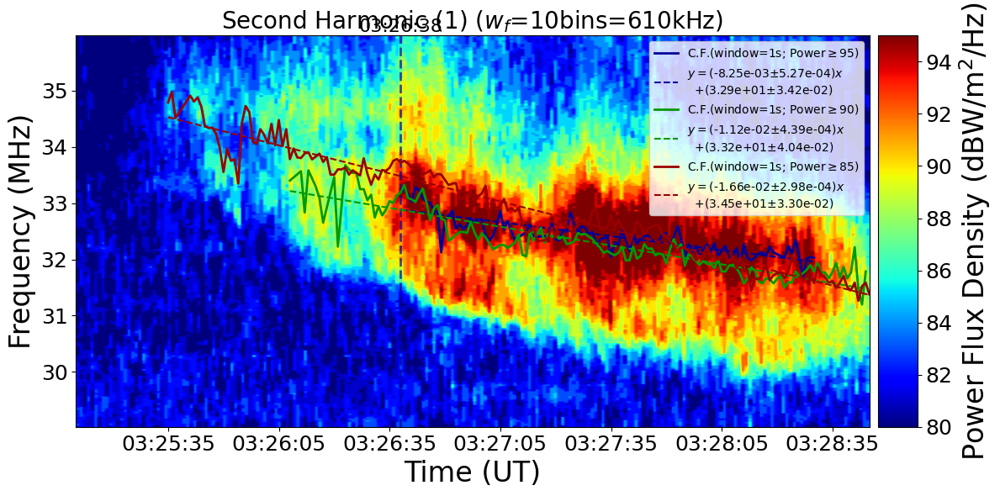

Original center_frequencies (before interpolation): [nan nan nan nan nan nan nan nan nan nan]
Interpolating NaN values in center_frequencies...
Interpolated center_frequencies: [nan nan nan nan nan nan nan nan nan nan]
Filtered center_frequencies: [16.59393311 16.63208008 16.57867432 16.51000977 16.63916397 16.61682129
 16.53919983 16.51477814 16.50238037 16.43371582]
Filtered time_sliced: DatetimeIndex(['2022-06-13 03:26:38', '2022-06-13 03:26:39',
               '2022-06-13 03:26:40', '2022-06-13 03:26:41',
               '2022-06-13 03:26:42', '2022-06-13 03:26:43',
               '2022-06-13 03:26:44', '2022-06-13 03:26:45',
               '2022-06-13 03:26:46', '2022-06-13 03:26:47'],
              dtype='datetime64[ns]', freq=None)
Frequency
slope [Power>=95]:-0.0037278236881562268, intercept [Power>=95]:16.422053319000252

Frequency
slope [Power>=95]:-0.0037278236881562268, intercept [Power>=95]:16.422053319000252

Original center_frequencies (before interpolation): [nan nan nan

In [ ]:
plot_filtered_lh_data_center_frequency(
    start_time=np.datetime64('2022-06-13T03:25:10'),
    end_time=np.datetime64('2022-06-13T03:28:45'),
    time_interval=30,  # 30秒ごとに目盛を追加
    frequency_interval=1,  # 1MHzごとに目盛を追加
    window_frequency_size=10, # カラープロットのノイズ消去
    window_smoothed_line=1, # 中心周波数の平滑化
    color_title='Second Harmonic (1) ($w_f$=10bins=610kHz)',
    histo_drift_title=r'Center Frequency drift rate histogram (1) ($\pm 3\sigma$)',
    histo_velocity_title=r'Burst Velocity histogram (1) ($\pm 3\sigma$)',
    burst_velocity_title=r'Burst Velocity-time evolution (1) BA model',
    rho_title=f'Velocity-time evolution (1) BA model',
    density_title=r'Density-Height evolution (1)',
    density_ratio_title=r'Density ratio-time evolution (1)'
)

## 後半

### window_frequency=10

window_smoothed_line=30, 60

start_frequency = 27.799999999999997MHz
end_frequency = 33.0MHz

No valid data for threshold 105, skipping fit.
Slope (MHz/s) [Power>=100]: -2.2121e-02, Intercept: 3.0785e+01 MHz
Slope standard deviation (MHz/s) [Power>=100]: 1.1231e-03
Intercept standard deviation (MHz) [Power>=100]: 5.2749e-02 

Slope (MHz/s) [Power>=95]: -2.1681e-02, Intercept: 3.1064e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 4.6514e-04
Intercept standard deviation (MHz) [Power>=95]: 3.2293e-02 



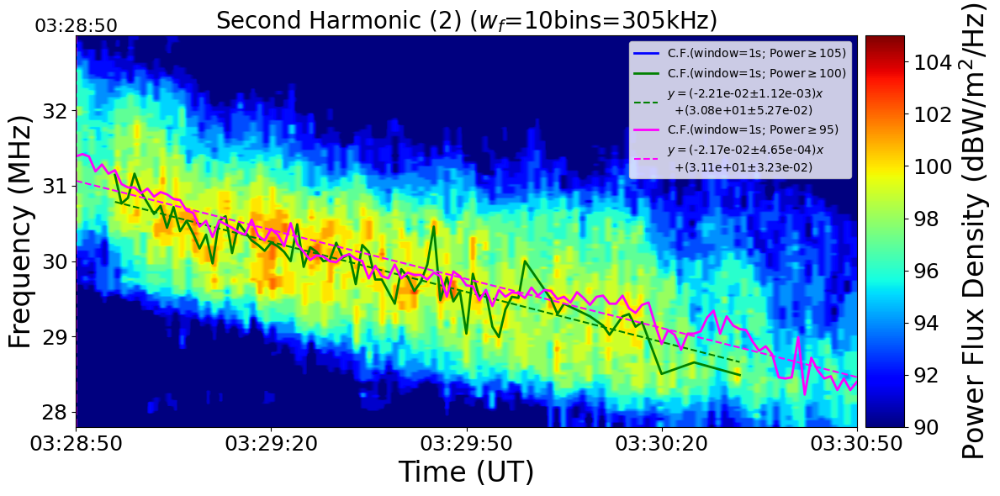

◎ 密度の計算 ◎
density_0_fit: 2937246.593647064
rho_0: 1.9375469514270685
フィットされた多項式: 
-1.425e+07 x + 3.055e+07

polyfit:  
-1.425e+07 x + 3.055e+07
density_0_fit: 2989362.458272448
rho_0: 1.931900428044795
フィットされた多項式: 
-1.395e+07 x + 2.995e+07

polyfit:  
-1.395e+07 x + 2.995e+07


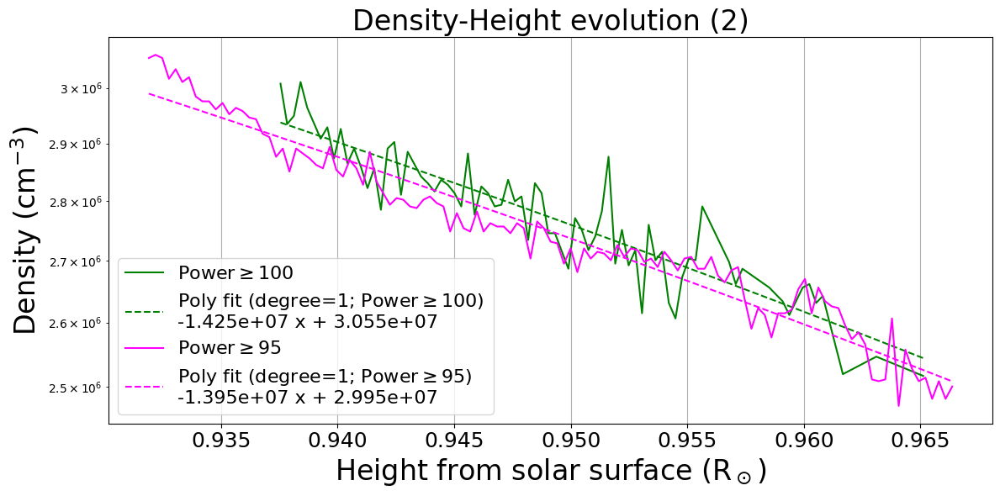

In [ ]:
plot_filtered_lh_data_center_frequency(
    start_time=np.datetime64('2022-06-13T03:28:50'),
    end_time=np.datetime64('2022-06-13T03:30:50'),
    time_interval=30,  # 30秒ごとに目盛を追加
    frequency_interval=1,  # 1MHzごとに目盛を追加
    window_frequency_size=10,
    window_smoothed_line=1,
    color_title='Second Harmonic (2) ($w_f$=10bins=305kHz)',
    histo_drift_title=r'Center Frequency drift rate histogram (2) ($\pm 3\sigma$)',
    histo_velocity_title=r'Burst Velocity histogram (2) ($\pm 3\sigma$)',
    burst_velocity_title=r'Burst Velocity-time evolution (2) BA model',
    rho_title=f'Distance-time evolution (2) BA model',
    density_title=r'Density-Height evolution (2)',
    density_ratio_title=r'Density ratio-time evolution (2)'
    )

start_frequency = 27.0MHz
end_frequency = 33.0MHz

Slope (MHz/s) [Power>=95]: -2.0880e-02, Intercept: 3.0518e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

Slope (MHz/s) [Power>=90]: -2.3264e-02, Intercept: 3.0968e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 4.7216e-04
Intercept standard deviation (MHz) [Power>=90]: 3.3818e-02 



/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Slope (MHz/s) [Power>=85]: -1.8712e-02, Intercept: 3.0889e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 4.6132e-04
Intercept standard deviation (MHz) [Power>=85]: 3.4691e-02 



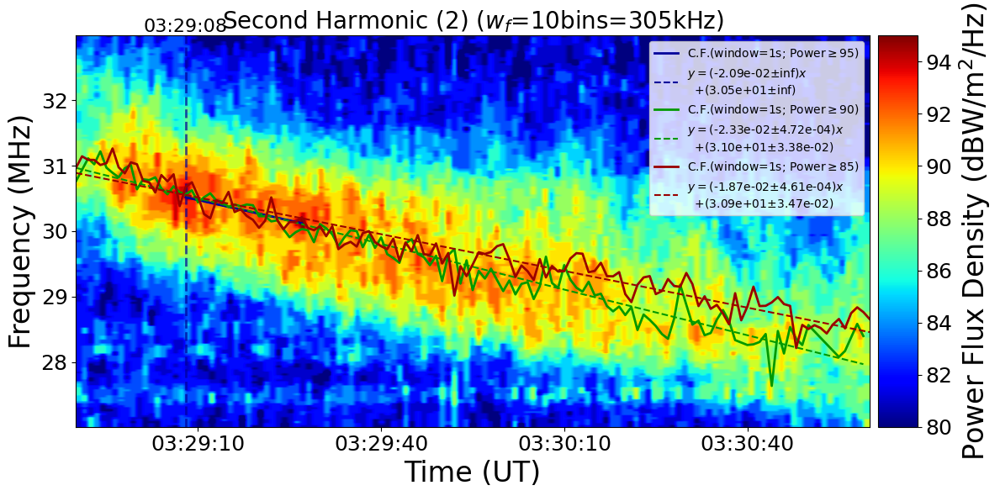

Original center_frequencies (before interpolation): [nan nan nan nan nan nan nan nan nan nan]
Interpolating NaN values in center_frequencies...
Interpolated center_frequencies: [nan nan nan nan nan nan nan nan nan nan]
Filtered center_frequencies: [15.25878906 15.24834884 15.23790861 15.22746839 15.21702817 15.20658794
 15.19614772 15.18570749 15.17526727 15.16482705]
Filtered time_sliced: DatetimeIndex(['2022-06-13 03:29:08', '2022-06-13 03:29:09',
               '2022-06-13 03:29:10', '2022-06-13 03:29:11',
               '2022-06-13 03:29:12', '2022-06-13 03:29:13',
               '2022-06-13 03:29:14', '2022-06-13 03:29:15',
               '2022-06-13 03:29:16', '2022-06-13 03:29:17'],
              dtype='datetime64[ns]', freq=None)
Frequency
slope [Power>=95]:-0.0005134723949870628, intercept [Power>=95]:15.098045795691506

Frequency
slope [Power>=95]:-0.0005134723949870628, intercept [Power>=95]:15.098045795691506

Original center_frequencies (before interpolation): [15.38085938

In [ ]:
plot_filtered_lh_data_center_frequency(
    start_time=np.datetime64('2022-06-13T03:28:50'),
    end_time=np.datetime64('2022-06-13T03:31:00'),
    time_interval=30,  # 30秒ごとに目盛を追加
    frequency_interval=1,  # 1MHzごとに目盛を追加
    window_frequency_size=10,
    window_smoothed_line=1,
    color_title='Second Harmonic (2) ($w_f$=10bins=305kHz)',
    histo_drift_title=r'Center Frequency drift rate histogram (2) ($\pm 3\sigma$)',
    histo_velocity_title=r'Burst Velocity histogram (2) ($\pm 3\sigma$)',
    burst_velocity_title=r'Burst Velocity-time evolution (2) BA model',
    rho_title=f'Distance-time evolution (2) BA model',
    density_title=r'Density-Height evolution (2)',
    density_ratio_title=r'Density ratio-time evolution (2)'
    )

# 前半+後半

## 全体

start_frequency =  0.0
end_frequency = 50000000.0

min(LH) 63
max(LH) 160
mean(LH) 86.78600379372428
Converted LH Data: Min=-201.23000000000002, Max=-104.23000000000002, Mean=-177.44399620626072


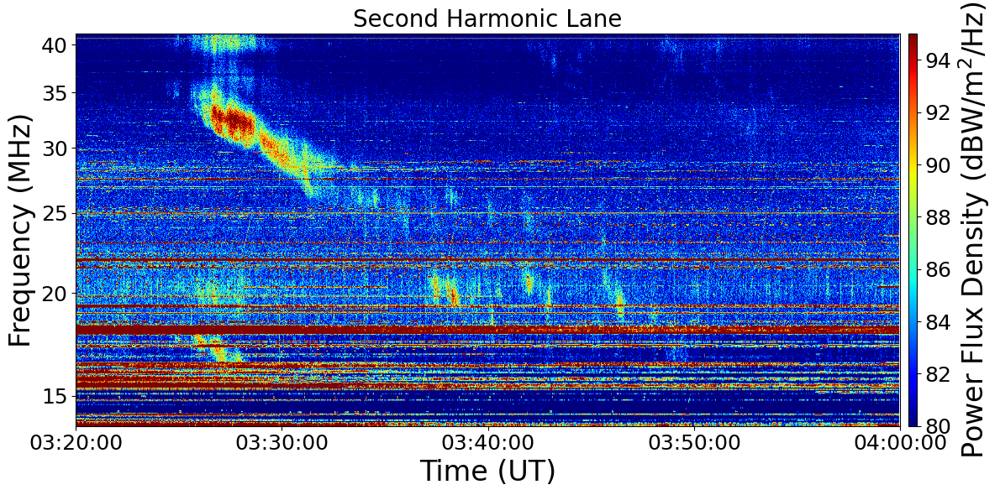

In [14]:
vmin=80
vmax-95
plot_filtered_lh_data(start_time=np.datetime64('2022-06-13T03:20:00'),
    end_time=np.datetime64('2022-06-13T04:00:00'),
    title='Second Harmonic Lane',
    time_interval=60*10,
    frequency_interval=5,
    window_frequency_size=1
    )

start_frequency =  25000000.0
end_frequency = 38000000.0



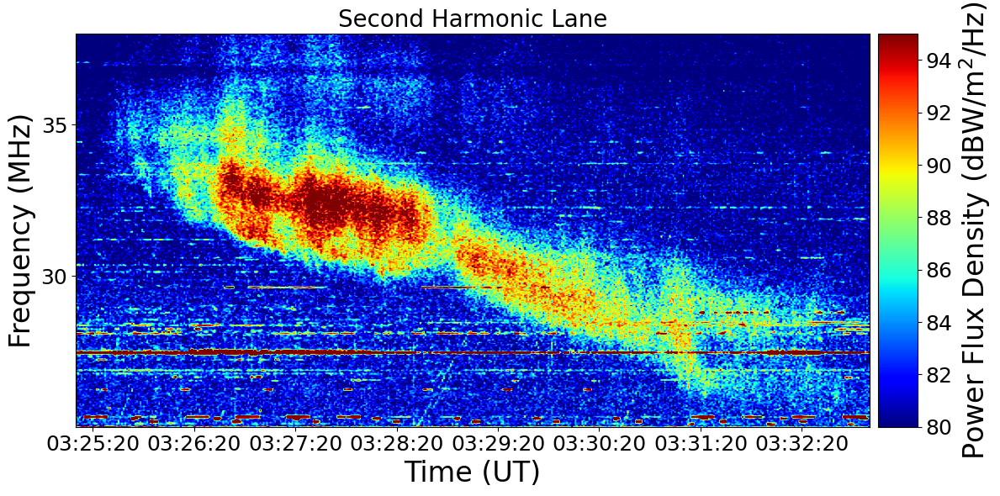

In [ ]:
vmin=80
vmax-95
plot_filtered_lh_data(start_time=np.datetime64('2022-06-13T03:25:10'),
    end_time=np.datetime64('2022-06-13T03:33:00'),
    title='Second Harmonic Lane',
    time_interval=60*1,
    frequency_interval=5,
    window_frequency_size=1
    )

前半：start_time=np.datetime64('2022-06-13T03:25:20'), end_time=np.datetime64('2022-06-13T03:28:45')

後半：start_time=np.datetime64('2022-06-13T03:28:50'), end_time=np.datetime64('2022-06-13T03:30:50')

## 関数

## カラープロット+ライン

In [57]:
def plot_second_harmonic_lane():
    window_time_size = 1
    window_frequency_size = 7
    
    def initial_settings(start_time, end_time, max_frequency, min_frequency):
        
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        ##################### スライス #############################
        # 時間範囲でデータをスライス
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
        time_sliced = time[time_mask]  # 時間もスライス

        # 周波数範囲でデータをスライス
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
        frequency_sliced = frequency[freq_mask]  # 周波数もスライス
        frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

        # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
        
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz
    
    
    ########################################################################
    ################## スペクトル ##################
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 26e6
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum)    
    
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:20')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 36.1e6
    min_frequency_1 = 29.5e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1)
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2)
    
    ######################################################################
    ########################## ax1 ###############################################
    ##################　カラープロット ##################
    fig, axes = plt.subplots(2,1,figsize=(12, 12), sharex=True, sharey=False)
    
    ###################################
    ax = axes[0]

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power (dB)', fontsize=18)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    # ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)
    ax.set_title(f'Second Harmonic Lane (Window frequency={window_frequency_size}({window_frequency_size*30.5}kHz))', fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    ax.set_yscale('log')
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
    ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Minor ticks for finer control if needed
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.2g}"))
    ax.set_ylim(frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1])
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 26, 37, color='gray', linewidth=2, linestyle='--', alpha=0.7)
    ax.text(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 26, '03:28:50', color='black', fontsize=16, ha='center', va='top')
    
    #########################################################################
    ################## 前半 ##################
        # 閾値ごとの中心周波数計算
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        # center_frequency_line_plot(ax, time_sliced_1, smoothed_frequencies_1, 1, threshold, color, 'C.F.')
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold)
       
        
        # smoothed_frequenciesの最初の時間を取得
        
        # NaNでない最初の値を探す
        first_valid_index = np.where(~np.isnan(smoothed_frequencies_1))[0][0]
        first_valid_time = time_sliced_1[first_valid_index]
        format_time = first_valid_time.strftime('%H:%M:%S')
        # 垂直線を引く
        
        ax.vlines(mdates.date2num(first_valid_time), 26, 37, color=color, linewidth=2, linestyle='--', alpha=0.7)
            # ax.text(mdates.date2num(first_valid_time), 26, f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')
            
            
    #########################################################################
    ################## 後半 ##################
        # 閾値ごとの中心周波数計算
    colors_2 = ['#336699', '#669966', '#996666']
    for threshold, color in zip(thresholds, colors_2):
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        # center_frequency_line_plot(ax, time_sliced_2, smoothed_frequencies_2, 1, threshold, color, 'C.F.')
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color, threshold)
        
        last_valid_index = np.where(~np.isnan(smoothed_frequencies_2))[0][-1]
        last_valid_time = time_sliced_2[last_valid_index]
        format_time = last_valid_time.strftime('%H:%M:%S')
        # 垂直線を引く
        
        ax.vlines(mdates.date2num(last_valid_time), 26, 37, color=color, linewidth=2, linestyle='--', alpha=0.7)
            # ax.text(mdates.date2num(last_valid_time), 26, f'{format_time}', color='black', fontsize=16, ha='center', va='top')
       
    
    #############################################################
    # 凡例の追加
    ax.legend(loc='best', fontsize=10)
    
    
    
    #####################################################################################
    ################################## ax2 ###################################################
    ax = axes[1]
    
    def plot_vertical_line(time_sliced, filtered_lh_data, frequency_sliced_mhz, color):
        first_valid_time_list = []
        last_valid_time_list = []
        for threshold, color in zip(thresholds, color):
            lh_data_sliced_filtered = np.where(filtered_lh_data >= threshold, filtered_lh_data, np.nan)
            center_frequencies = find_center_frequencies(lh_data_sliced_filtered, frequency_sliced_mhz, threshold)
            smoothed_frequencies = smoothed_center_frequencies(center_frequencies, window_size=1)
            # smoothed_frequencies = 1/2 * smoothed_frequencies # Second HarmonicなのでFundamental (fp) に修正
            center_frequency_line_plot(ax, time_sliced, smoothed_frequencies, 1, threshold, color, 'C.F.')
            fit_line_to_center_frequencies(ax, time_sliced, smoothed_frequencies, color, threshold)
            
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            first_valid_time_list.append(first_valid_time)
            format_time = first_valid_time.strftime('%H:%M:%S')
                
            
            
            last_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][-1]
            last_valid_time = time_sliced[last_valid_index]
            last_valid_time_list.append(last_valid_time)
            format_time = last_valid_time.strftime('%H:%M:%S')
            # 垂直線を引く
            # if threshold == 85 or threshold == 95:
            #     ax.vlines(mdates.date2num(last_valid_time), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1], color=color, linewidth=2, linestyle='--', alpha=0.7)
            #     ax.text(mdates.date2num(last_valid_time), 26, f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')
                
        return first_valid_time_list, last_valid_time_list
    
        ################## 前半 ##################
        # 閾値ごとの中心周波数計算
    first_valid_time_list_1, _ = plot_vertical_line(time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1, colors)
    for threshold, first_valid_time, color in zip(thresholds, first_valid_time_list_1, colors):
        if threshold == 85 or threshold == 95:
            format_time = first_valid_time.strftime('%H:%M:%S')
            ax.vlines(mdates.date2num(first_valid_time), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1], color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax.text(mdates.date2num(first_valid_time), frequency_sliced_mhz_spectrum[0], f'{format_time}', color=color, fontsize=16, ha='center', va='top')
        if threshold == 90:
            format_time = first_valid_time.strftime('%H:%M:%S')
            ax.vlines(mdates.date2num(first_valid_time), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1], color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax.text(mdates.date2num(first_valid_time), frequency_sliced_mhz_spectrum[-1], f'{format_time}', color=color, fontsize=16, ha='center', va='bottom')
    
       
        
            
    #########################################################################
    ################## 後半 ##################
        # 閾値ごとの中心周波数計算
    colors_2 = ['#336699', '#669922', '#994444']
    _ , last_valid_time_list_2 = plot_vertical_line(time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2, colors_2)
    for threshold, last_valid_time, color in zip(thresholds, last_valid_time_list_2, colors_2):
        if threshold == 85:
            format_time = last_valid_time.strftime('%H:%M:%S')
            ax.vlines(mdates.date2num(last_valid_time), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1], color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax.text(mdates.date2num(last_valid_time), frequency_sliced_mhz_spectrum[0], f'{format_time}', color=color, fontsize=16, ha='center', va='top')
        if threshold == 95:
            format_time = last_valid_time.strftime('%H:%M:%S')
            ax.vlines(mdates.date2num(last_valid_time), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1], color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax.text(mdates.date2num(last_valid_time), frequency_sliced_mhz_spectrum[-1], f'{format_time}', color=color, fontsize=16, ha='center', va='bottom')
    
    
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1], color='gray', linewidth=2, linestyle='--', alpha=0.7)
    ax.text(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), frequency_sliced_mhz_spectrum[0], '03:28:50', color='black', fontsize=16, ha='center', va='top')    
    ax.tick_params(axis='both', labelsize=18)
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_ylabel(r'Frequency ($2f_p$) (MHz)', fontsize=24)
    ax.set_yscale('log')
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
    ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Minor ticks for finer control if needed

    # Custom formatter for scientific notation
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.2g}"))

    # Additional settings
    ax.grid(True, which='both', axis='y', linestyle='--', color='gray', alpha=0.7)
    ax.grid(True, which='both', axis='x', linestyle='--', color='lightgray', alpha=0.5)
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
    ax.set_title(r'Averaged frequency and fitted lines ($2f_p$)', fontsize=20)

    # レイアウトの調整
    plt.tight_layout()
    plt.show()

Slope (MHz/s) [Power>=95]: -8.3767e-03, Intercept: 3.2875e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 5.0782e-04
Intercept standard deviation (MHz) [Power>=95]: 3.4166e-02 

Slope (MHz/s) [Power>=90]: -1.1405e-02, Intercept: 3.3198e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 3.9505e-04
Intercept standard deviation (MHz) [Power>=90]: 3.7139e-02 

Slope (MHz/s) [Power>=85]: -1.6171e-02, Intercept: 3.4456e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 3.0718e-04
Intercept standard deviation (MHz) [Power>=85]: 3.4895e-02 

Slope (MHz/s) [Power>=95]: -2.4093e-02, Intercept: 3.0563e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

Slope (MHz/s) [Power>=90]: -2.1885e-02, Intercept: 3.0868e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 5.0850e-04
Intercept standard deviation (MHz) [Power>=90]: 4.3216e-02 

Slope (MHz/s) [Power>=85]: -1.7706e-02, Intercept: 3.0781e+01 MHz
Slope standard deviation (MH

/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Slope (MHz/s) [Power>=90]: -1.1405e-02, Intercept: 3.3198e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 3.9505e-04
Intercept standard deviation (MHz) [Power>=90]: 3.7139e-02 

Slope (MHz/s) [Power>=85]: -1.6171e-02, Intercept: 3.4456e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 3.0718e-04
Intercept standard deviation (MHz) [Power>=85]: 3.4895e-02 

Slope (MHz/s) [Power>=95]: -2.4093e-02, Intercept: 3.0563e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

Slope (MHz/s) [Power>=90]: -2.1885e-02, Intercept: 3.0868e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 5.0850e-04
Intercept standard deviation (MHz) [Power>=90]: 4.3216e-02 

Slope (MHz/s) [Power>=85]: -1.7706e-02, Intercept: 3.0781e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 3.6616e-04
Intercept standard deviation (MHz) [Power>=85]: 3.1763e-02 



/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


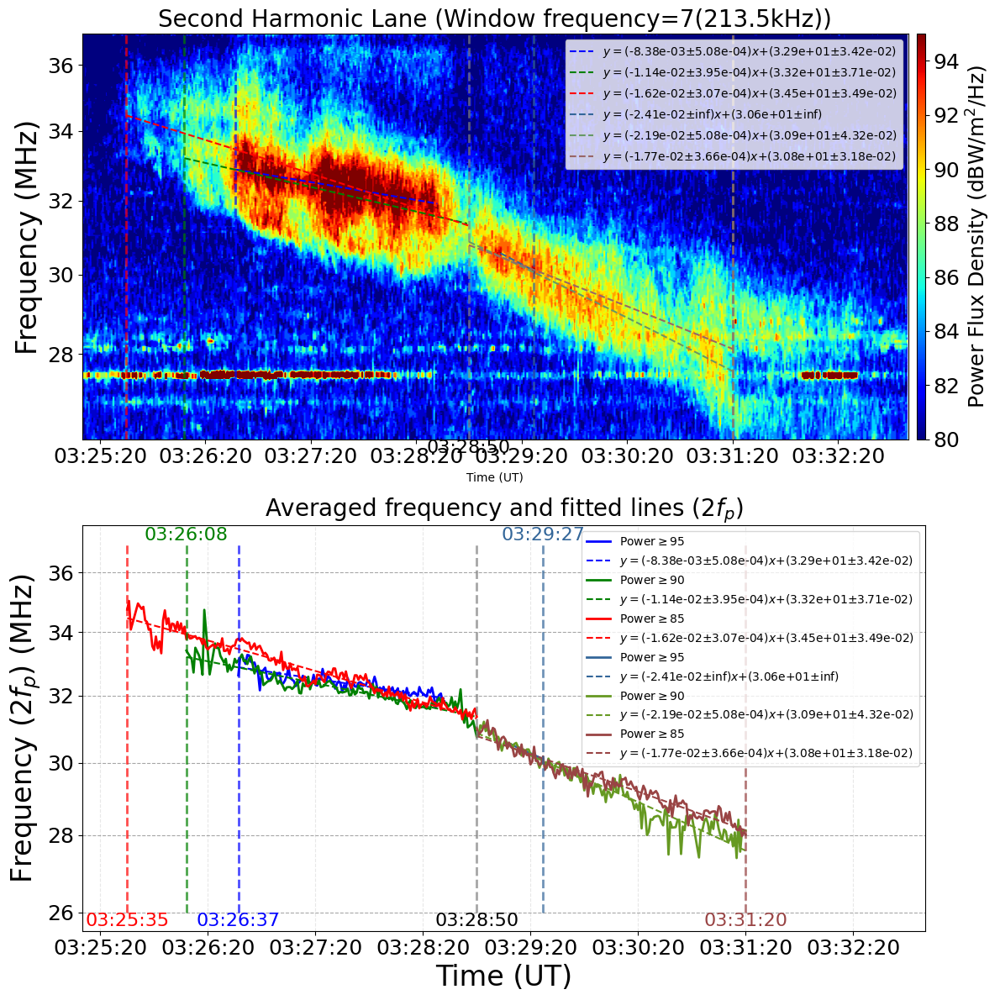

In [58]:
plot_second_harmonic_lane()

## 背景で割る

start_frequency =  26000000.0
end_frequency = 37000000.0



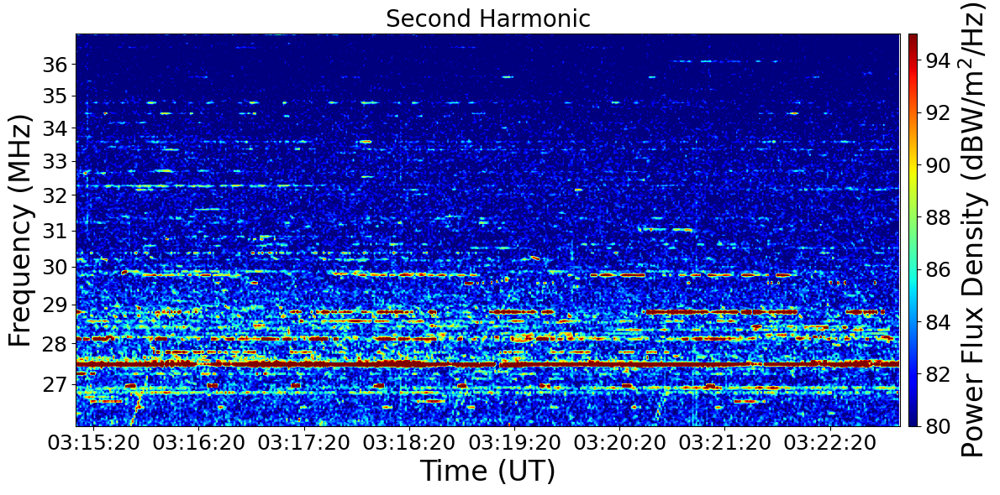

In [36]:
plot_filtered_lh_data(start_time=np.datetime64('2022-06-13T03:15:10'), end_time=np.datetime64('2022-06-13T03:23:00'), title='Second Harmonic', time_interval=60, frequency_interval=1, window_frequency_size=1)

start_frequency =  26000000.0
end_frequency = 37000000.0



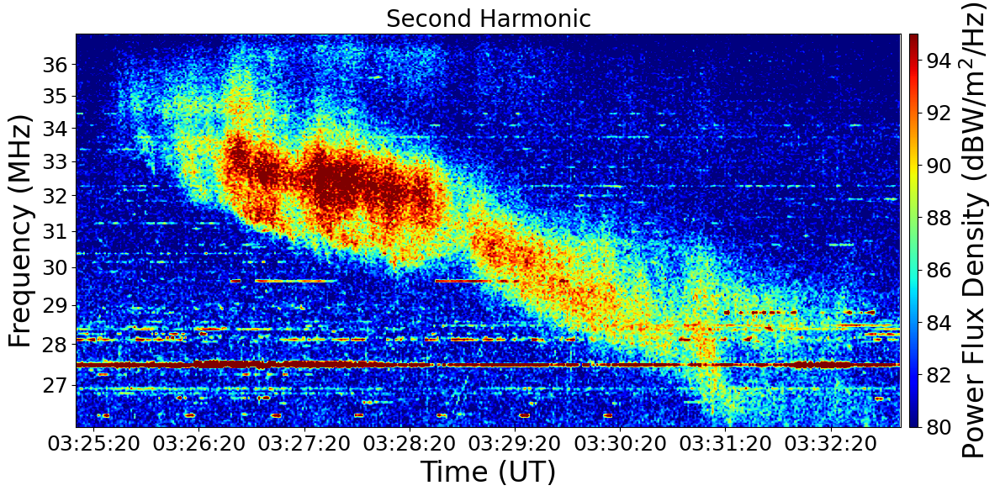

In [39]:
plot_filtered_lh_data(start_time=np.datetime64('2022-06-13T03:25:10'), end_time=np.datetime64('2022-06-13T03:33:00'), title='Second Harmonic', time_interval=60, frequency_interval=1, window_frequency_size=1)

In [79]:
def plot_filtered_lh_data_normalize(window_frequency_size, vmin, vmax):

    # 周波数をHzからMHzに変換
    start_frequency = 13 * 1e6
    print("start_frequency = ", start_frequency)
    end_frequency = 18 * 1e6
    print(f"end_frequency = {end_frequency}\n")
    
    start_time = np.datetime64('2022-06-13T03:25:10')
    end_time = np.datetime64('2022-06-13T03:33:00')
 

    #####################スライス#############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
    time_sliced = time[time_mask]  # 時間もスライス

    # 周波数範囲でデータをスライス
    freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    frequency_sliced = frequency[freq_mask]  # 周波数もスライス
    frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換
    
    lh_data_sliced = lh_data_sliced.astype(float)
    lh_data_noise = obtain_power(start_time-np.timedelta64(10, 'm'), end_time-np.timedelta64(10, 'm'), start_frequency, end_frequency).astype(float)
    lh_data_sliced = normalize_lh_data_along_time_line(lh_data_sliced, lh_data_noise)
    print(lh_data_sliced)

    # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
    window_time_size = 1
    window_frequency_size = window_frequency_size
    filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

    ##########################カラープロットの作成##################################
    fig, ax = plt.subplots(figsize=(12, 6))

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power (dB)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)

    ax.set_title('Second Harmonic (normalize)', fontsize=20)
    ax.set_yscale('log')
        # 目盛の位置をカスタムに指定し、2桁の整数を表示
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs='auto'))
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):d}" if x >= 10 else ""))


    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(mdates.SecondLocator(interval=60))  # 60秒ごとに目盛りを追加
    y_major_locator = MultipleLocator(1)  # 1MHzごとに目盛を追加
    ax.yaxis.set_major_locator(y_major_locator)
   

    # レイアウトの調整
    plt.tight_layout()
    plt.show()

start_frequency =  13000000.0
end_frequency = 18000000.0

power_average =  [108.32908705 113.65605096 108.05732484 100.97239915  95.84076433
  86.28237792  96.35456476  96.72611465  89.16985138  83.58174098
  78.64755839  82.18471338  87.93418259  91.39490446  99.07855626
  97.59872611  83.26751592  78.51167728  77.49893843  76.45010616
  76.29511677  75.76433121  75.2866242   75.62208068  76.79193206
  76.05307856  77.57749469  82.06369427  80.0955414   79.30360934
  77.97027601  77.53503185  85.14012739  93.7133758   91.81953291
  79.16135881  78.08280255  78.57112527  77.47983015  76.83864119
  76.98089172  83.98726115  88.82165605  84.15498938  79.21231423
  77.92993631  76.55414013  90.03184713  95.89384289  90.12951168
  87.26326964 102.25902335 107.30360934 110.56900212 108.81316348
 106.95753715 107.68152866 100.5329087   91.7940552   92.86199575
 100.86624204 100.3163482   98.44373673 101.24840764 103.85774947
 100.31210191  94.3163482   94.16348195  90.41401274  83.22080679
 

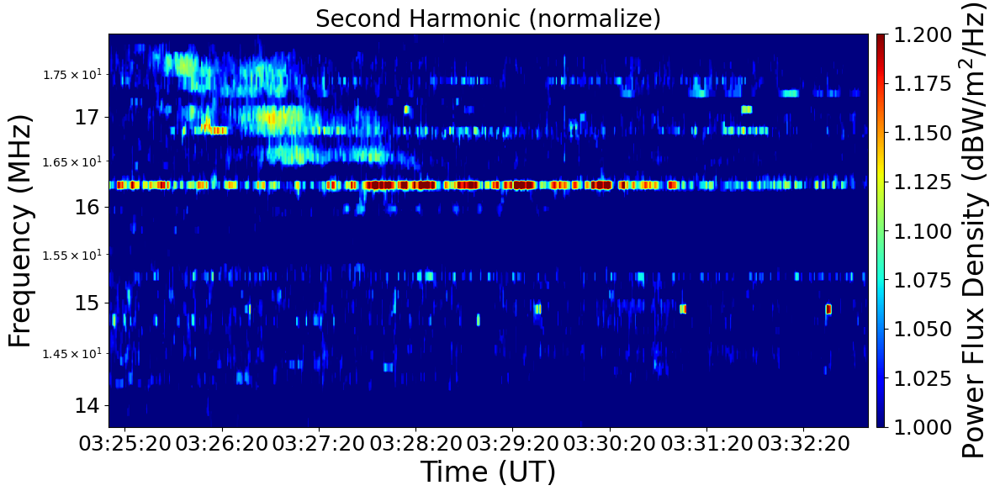

In [80]:
plot_filtered_lh_data_normalize(window_frequency_size=5, vmin=1.0, vmax=1.2)

## カラープロット+ラインプロット×3

In [71]:
def plot_second_harmonic_lane_each_threshold():
    def initial_settings(start_time, end_time, max_frequency, min_frequency, window_spectrum_frequency):
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        # Slicing data by time
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # Sliced by time
        time_sliced = time[time_mask]  # Also slice time

        # Slicing data by frequency
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # Sliced by frequency
        frequency_sliced = frequency[freq_mask]  # Also slice frequency
        frequency_sliced_mhz = frequency_sliced / 1e6  # Convert to MHz

        # Apply moving median filter along frequency axis to reduce noise
        window_time_size = 1
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_spectrum_frequency))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz

    # Spectrum settings and data
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 25e6
    window_spectrum_frequency = 7
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(
        start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum, window_spectrum_frequency
    )
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:10')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 37e6
    min_frequency_1 = 29e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1, window_spectrum_frequency)
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2, window_spectrum_frequency)
    
    
    
    
    ######################################################################
    ########################## ax0 ###############################################
    ##################　カラープロット ##################

    # Start plotting with subplots and log-scaled y-axes
    fig, axes = plt.subplots(2, 2, figsize=(24, 12), sharex=True, sharey=True)
    
    

    ################################### ax0 ##################################
    ax = axes[0, 0]  # Subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)
    
    # Color plot settings with logarithmic frequency axis
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')
    
    cbar = plt.colorbar(img, cax=cax)
    cbar.ax.tick_params(labelsize=18)
    
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
    
    ax.set_title(f'Second Harmonic Lane (Window frequency={window_spectrum_frequency}({window_spectrum_frequency*30.5}kHz))', fontsize=20)
    
    ax.set_yscale('log')  # Set frequency axis to log scale
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs='auto'))
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):d}" if x >= 10 else ""))  # Modified for 2-digit integer labels
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))
    
        # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    y_major_locator = MultipleLocator(1)  # 周波数軸
    ax.yaxis.set_major_locator(y_major_locator)
    
    ax.set_ylim(frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1])
    
    
    
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 25, 37, color='white', linewidth=2, linestyle='--', alpha=0.7)
    # ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 25, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")


    

    #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold)
    
    colors_2 = ['#336699', '#669900', '#996666']
    for threshold, color in zip(thresholds, colors_2):
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color, threshold)

    #####################################################################################
    def ax_plot_line(ax, threshold, color, color_2):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        center_frequency_line_plot(ax, time_sliced_1, smoothed_frequencies_1, 1, threshold, color, 'C.F.')
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold)
                
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        center_frequency_line_plot(ax, time_sliced_2, smoothed_frequencies_2, 1, threshold, color_2, 'C.F.')
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color_2, threshold)
        
        
                # Find the first valid index and time for smoothed frequencies
        def first_valid_index_time(smoothed_frequencies, time_sliced, color):
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            first_format_time = first_valid_time.strftime('%H:%M:%S')

            ax.text(mdates.date2num(first_valid_time), smoothed_frequencies[first_valid_index]+0.2, f'{smoothed_frequencies[first_valid_index]:.1f}', color='black', fontsize=16, ha='left', va='bottom')
            
            
        def last_valid_index_time(smoothed_frequencies, time_sliced, color):
            last_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][-1]
            last_valid_time = time_sliced[last_valid_index]
            last_format_time = last_valid_time.strftime('%H:%M:%S')

            ax.text(mdates.date2num(last_valid_time), smoothed_frequencies[last_valid_index]-0.2, f'{smoothed_frequencies[last_valid_index]:.1f}', color='black', fontsize=16, ha='right', va='top')
        
        first_valid_index_time(smoothed_frequencies_1, time_sliced_1, color)
        last_valid_index_time(smoothed_frequencies_1, time_sliced_1, color)
        first_valid_index_time(smoothed_frequencies_2, time_sliced_2, color_2)
        last_valid_index_time(smoothed_frequencies_2, time_sliced_2, color_2)
        
        ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 26, 37, color='black', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 25, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")
        
        first_valid_index = np.where(~np.isnan(smoothed_frequencies_1))[0][0]
        first_valid_time = time_sliced_1[first_valid_index]
        format_time = first_valid_time.strftime('%H:%M:%S')
        # 垂直線を引く
        ax.vlines(mdates.date2num(first_valid_time), 26, 37, color=color, linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(first_valid_time), 25, f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')
        
        last_valid_index = np.where(~np.isnan(smoothed_frequencies_2))[0][-1]
        last_valid_time = time_sliced_2[last_valid_index]
        format_time = last_valid_time.strftime('%H:%M:%S')
        # 垂直線を引く
        ax.vlines(mdates.date2num(last_valid_time), 26, 37, color=color_2, linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(last_valid_time), 25, f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')
        

        ax.set_yscale('log')  # Apply log scale to frequency axis
        ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs='auto'))
        ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):d}" if x >= 10 else ""))
        ax.set_yscale('log')
        ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs='auto'))
        ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):d}" if x >= 10 else ""))
        
        # Enable grid with specific options to ensure visibility on log scale
        ax.grid(True, which='both', axis='y', linestyle='--', color='gray', alpha=0.7)  # Show y-axis gridlines in log scale
        ax.grid(True, which='both', axis='x', linestyle='--', color='lightgray', alpha=0.5)  # Optionally enable x-axis gridlines
        
        ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
        ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)

        ax.set_xlabel('Time (UT)', fontsize=24)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        ax.set_ylabel('Frequency (MHz)', fontsize=24)
        ax.set_ylim(frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1])
        ax.set_title(f'Average frequency; fit lines (Power$\geq${threshold})', fontsize=20)
        ax.legend(loc='best', fontsize=16)
        
    
    # Repeat the same configuration for other subplots with log y-axis
    ax_plot_line(axes[0, 1], thresholds[0], colors[0], colors_2[0])
    axes[0, 1].set_yscale('log')  # Apply log scale to frequency axis
    
    ax_plot_line(axes[1, 0], thresholds[1], colors[1], colors_2[1])
    axes[1, 0].set_yscale('log')  # Apply log scale to frequency axis
    
    ax_plot_line(axes[1, 1], thresholds[2], colors[2], colors_2[2])
    axes[1, 1].set_yscale('log')  # Apply log scale to frequency axis

    plt.tight_layout()
    plt.show()


Slope (MHz/s) [Power>=95]: -8.3767e-03, Intercept: 3.2875e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 5.0782e-04
Intercept standard deviation (MHz) [Power>=95]: 3.4166e-02 

Slope (MHz/s) [Power>=90]: -1.1405e-02, Intercept: 3.3198e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 3.9505e-04
Intercept standard deviation (MHz) [Power>=90]: 3.7139e-02 

Slope (MHz/s) [Power>=85]: -1.5862e-02, Intercept: 3.4474e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 3.4158e-04
Intercept standard deviation (MHz) [Power>=85]: 3.8803e-02 

Slope (MHz/s) [Power>=95]: -2.4093e-02, Intercept: 3.0563e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

Slope (MHz/s) [Power>=90]: -2.1885e-02, Intercept: 3.0868e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 5.0850e-04
Intercept standard deviation (MHz) [Power>=90]: 4.3216e-02 

Slope (MHz/s) [Power>=85]: -1.7706e-02, Intercept: 3.0781e+01 MHz
Slope standard deviation (MH

/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


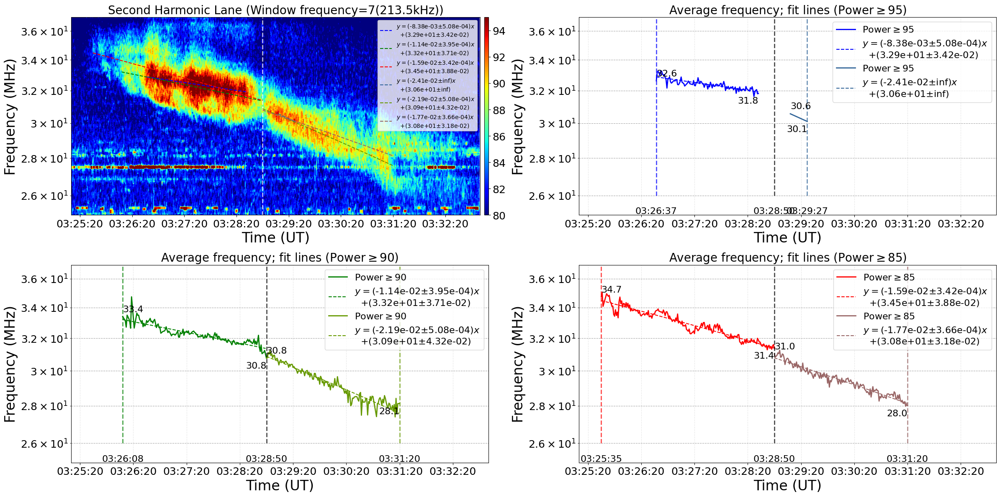

In [72]:
plot_second_harmonic_lane_each_threshold()

## Density - time

### ラインプロットを一つにまとめる

In [12]:
def plot_density_from_frequency():
    def initial_settings(start_time, end_time, max_frequency, min_frequency, window_spectrum_frequency):
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        # Slicing data by time
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # Sliced by time
        time_sliced = time[time_mask]  # Also slice time

        # Slicing data by frequency
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # Sliced by frequency
        frequency_sliced = frequency[freq_mask]  # Also slice frequency
        frequency_sliced_mhz = frequency_sliced / 1e6  # Convert to MHz

        # Apply moving median filter along frequency axis to reduce noise
        window_time_size = 1
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_spectrum_frequency))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz

    # Spectrum settings and data
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 25e6
    window_spectrum_frequency = 7
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_mhz_spectrum = initial_settings(
        start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum, window_spectrum_frequency
    )
    density_spectrum = density_from_frequency(frequency_mhz_spectrum)
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:10')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 37e6
    min_frequency_1 = 29e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1, window_spectrum_frequency)
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2, window_spectrum_frequency)
    
    
    
    
    ######################################################################
    ########################## ax0 ###############################################
    ##################　カラープロット ##################

    # Start plotting with subplots and log-scaled y-axes
    fig, axes = plt.subplots(2, 1, figsize=(12, 12), sharex=True)
    
    

    ################################### ax0 ##################################
    ax = axes[0]  # Subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)
    
    # Color plot settings with logarithmic frequency axis
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), frequency_mhz_spectrum[0], frequency_mhz_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')
    
    cbar = plt.colorbar(img, cax=cax)
    cbar.ax.tick_params(labelsize=18)
    
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel(r'$2f_p$ frequency (MHz)', fontsize=24)
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
    
    ax.set_title(f'Second Harmonic Lane (Window frequency={window_spectrum_frequency}({window_spectrum_frequency*30.5}kHz))', fontsize=20)
    
    # ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
    # ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Minor ticks for finer control if needed

    # # Custom formatter for scientific notation
    # ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x*1e-6:.1f}"))
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))
    
    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    y_major_locator = MultipleLocator(1)  # 周波数軸
    ax.yaxis.set_major_locator(y_major_locator)
    
    ax.set_ylim(frequency_mhz_spectrum[0],frequency_mhz_spectrum[-1])
    
    
    
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), frequency_mhz_spectrum[0], frequency_mhz_spectrum[-1], color='white', linewidth=2, linestyle='--', alpha=0.7)
    # ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 25, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")


    

    #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
        #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold)
    
    colors_2 = ['#336699', '#669900', '#996666']
    for threshold, color in zip(thresholds, colors_2):
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color, threshold)


    #####################################################################################



    def ax_plot_line(ax, threshold, color, color_2):
        # Convert time slices to numerical format for fitting
        time_sliced_1_num = mdates.date2num(time_sliced_1)
        time_sliced_2_num = mdates.date2num(time_sliced_2)
        
        degree = 2  # Set degree to 1 for linear fit, or change to 2 for quadratic fit

        # Data processing for 前半
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        smoothed_frequencies_1 /= 2
        density_from_center_frequency_1 = density_from_frequency(smoothed_frequencies_1)
        
        # Data processing for 後半
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        smoothed_frequencies_2 /= 2
        density_from_center_frequency_2 = density_from_frequency(smoothed_frequencies_2)

        # Plotting
        ax.plot(time_sliced_1, density_from_center_frequency_1, color=color, label=f'Power$\geq${threshold}')
        # fit_line_to_center_frequencies(ax, time_sliced_1, density_from_center_frequency_1, color, threshold)
        
        ax.plot(time_sliced_2, density_from_center_frequency_2, color=color_2, label=f'Power$\geq${threshold}')
        # degree=1のとき
        fit_line_to_center_frequencies(ax, time_sliced_2, density_from_center_frequency_2, color_2, threshold)
        
        # # degree >= 2のとき
        # fitted_value_1, poly_coeffs_1 = calculate_polynomial_fit(time_sliced_1, density_from_center_frequency_1, degree=2)
        # ax.plot(time_sliced_1, fitted_value_1, color=color, label=f'Second order fit', linestyle='--', linewidth=2, alpha=0.7)
        
        # fitted_values_2, poly_coeffs_2 = calculate_polynomial_fit(time_sliced_2, density_from_center_frequency_2, degree=2)
        # ax.plot(time_sliced_2, fitted_values_2, color=color_2, label=f'Second order fit', linestyle='--', linewidth=2, alpha=0.7)


        
                # Set the time range for the plot
        ymin = density_from_frequency(frequency_mhz_spectrum[0]/2)
        ymax = density_from_frequency(frequency_mhz_spectrum[-1]/2)
        ax.set_ylim(ymin, ymax)
                
        # Find the first valid index and time for smoothed frequencies
        def first_and_last_valid_index_time(smoothed_frequencies, time_sliced, color):
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            first_format_time = first_valid_time.strftime('%H:%M:%S')
            
            last_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][-1]
            last_valid_time = time_sliced[last_valid_index]
            last_format_time = last_valid_time.strftime('%H:%M:%S')
            
            return first_valid_index, first_valid_time, first_format_time, last_valid_index, last_valid_time, last_format_time

        first_valid_index_1, first_valid_time_1, first_format_time_1, last_valid_index_1, last_valid_time_1, last_format_time_1 = first_and_last_valid_index_time(smoothed_frequencies_1, time_sliced_1, color)
        first_valid_index_2, first_valid_time_2, first_format_time_2, last_valid_index_2, last_valid_time_2, last_format_time_2 = first_and_last_valid_index_time(smoothed_frequencies_2, time_sliced_2, color_2)
        
        
        
        # それぞれの時間におけるDensityを表示
        ax.text(mdates.date2num(first_valid_time_1), density_from_center_frequency_1[first_valid_index_1]+0.15e6, f'{density_from_center_frequency_1[first_valid_index_1]*1e-6:.2f}', color=color, fontsize=16, ha='left', va='bottom')
        ax.text(mdates.date2num(last_valid_time_1), density_from_center_frequency_1[last_valid_index_1]+0.15e6, f'{density_from_center_frequency_1[last_valid_index_1]*1e-6:.2f}', color=color, fontsize=16, ha='right', va='bottom')
        ax.text(mdates.date2num(first_valid_time_2), density_from_center_frequency_2[first_valid_index_2]-0.1e6, f'{density_from_center_frequency_2[first_valid_index_2]*1e-6:.2f}', color=color_2, fontsize=16, ha='left', va='top')
        ax.text(mdates.date2num(last_valid_time_2), density_from_center_frequency_2[last_valid_index_2]-0.1e6, f'{density_from_center_frequency_2[last_valid_index_2]*1e-6:.2f}', color=color_2, fontsize=16, ha='right', va='top')
        
        
        
        # slope, intercept = fit_line_to_center_frequencies(ax, time_sliced_1, density_from_center_frequency_1, color, threshold)
        time_sliced_spectrum_num = mdates.date2num(time_sliced_spectrum)
        # delta_time = time_sliced_spectrum_num - first_valid_time_1_num
        delta_time = (pd.to_datetime(time_sliced_spectrum) - pd.to_datetime(first_valid_time_1)).total_seconds()
        # delta_time = (mdates.date2num(time_sliced_spectrum) - mdates.date2num(time_sliced_1[0])) * 86400
        
        # 1のフィットラインを全時間帯まで伸ばすプロット
        slope, intercept = fit_line_to_center_frequencies(ax, time_sliced_1, density_from_center_frequency_1, color, threshold)
        density_line_1 = slope*delta_time + intercept
        # 1のフィットラインを伸ばした時に，last_valid_time_2におけるDensityを表示
        density_true_value = slope*(pd.to_datetime(last_valid_time_2)-pd.to_datetime(first_valid_time_1)).total_seconds() + intercept
        
        
        # # 2次のフィットラインを全時間帯まで伸ばすプロット
        # a_fit_param, b_fit_param, c_fit_param = poly_coeffs_1
        # density_line_1 = a_fit_param*delta_time**2 + b_fit_param*delta_time + c_fit_param

        # プロット
        ax.plot(time_sliced_spectrum, density_line_1, color=color, linestyle='--', linewidth=2, alpha=0.7)
# ax.text を使って density_true_value を注釈として追加
        ax.text(mdates.date2num(last_valid_time_2), density_true_value+0.1e6, f'{density_true_value*1e-6:.2f}', color=color, fontsize=16, ha='right', va='bottom')
        
        
        # 垂直線とそれに対応する時間を表示
        ax.vlines(mdates.date2num(first_valid_time_1), ymin, ymax, color, linewidth=2, linestyle='--', alpha=0.7)
        # ax.text(mdates.date2num(first_valid_time_1), ymin, f'{first_format_time_1}', color='black', fontsize=16, ha='center', va='bottom')
        
        ax.vlines(mdates.date2num(last_valid_time_2), ymin, ymax, color_2, linewidth=2, linestyle='--', alpha=0.7)
        # ax.text(mdates.date2num(last_valid_time_2), ymin, f'{last_format_time_2}', color='black', fontsize=16, ha='center', va='bottom')
        
        ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), ymin, ymax, color='black', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), ymin, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")

                
        
        # Setting y-axis to log scale and custom tick formatting
        ax.set_yscale('log')
        ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
        ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Minor ticks for finer control if needed

        # Custom formatter for scientific notation
        ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x*1e-6:.1f}"))

        # Additional settings
        ax.grid(True, which='both', axis='y', linestyle='--', color='gray', alpha=0.7)
        ax.grid(True, which='both', axis='x', linestyle='--', color='lightgray', alpha=0.5)
        ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
        ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
        ax.set_xlabel('Time (UT)', fontsize=24)
        ax.set_ylabel(r'$f_p$ Density ($\times10^6$/cc)', fontsize=24)
        ax.set_title(f'$f_p$ Density; fit lines', fontsize=20)
        # ax.legend(loc='best', fontsize=16)

        print(f'start density (1) Power>={threshold} {density_from_center_frequency_1[first_valid_index_1]*1e-6:.2f}')
        print(f'end density (1) Power>={threshold} {density_from_center_frequency_1[last_valid_index_1]*1e-6:.2f}')
        print(f'start density (2) Power>={threshold} {density_from_center_frequency_2[first_valid_index_2]*1e-6:.2f}')
        print(f'end density (2) Power>={threshold} {density_from_center_frequency_2[last_valid_index_2]*1e-6:.2f}')
    
    # Repeat the same configuration for other subplots with log y-axis
    ax = axes[1]
    for threshold, color, color_2 in zip(thresholds, colors, colors_2):
        ax_plot_line(ax, threshold, color, color_2)

    # ax.set_ylim(density_from_frequency(frequency_sliced_mhz_spectrum[0]), density_from_frequency(frequency_sliced_mhz_spectrum[-1]))
    plt.tight_layout()
    plt.show()
    
    

Slope (MHz/s) [Power>=95]: -8.3767e-03, Intercept: 3.2875e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 5.0782e-04
Intercept standard deviation (MHz) [Power>=95]: 3.4166e-02 

R^2 [Power>=95]: 0.7216
Slope (MHz/s) [Power>=90]: -1.1405e-02, Intercept: 3.3198e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 3.9505e-04
Intercept standard deviation (MHz) [Power>=90]: 3.7139e-02 

R^2 [Power>=90]: 0.8440
Slope (MHz/s) [Power>=85]: -1.5862e-02, Intercept: 3.4474e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 3.4158e-04
Intercept standard deviation (MHz) [Power>=85]: 3.8803e-02 

R^2 [Power>=85]: 0.9186
Slope (MHz/s) [Power>=95]: -2.4093e-02, Intercept: 3.0563e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

R^2 [Power>=95]: 1.0000
Slope (MHz/s) [Power>=90]: -2.1885e-02, Intercept: 3.0868e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 5.0850e-04
Intercept standard deviation (MHz) [Power>=90]: 4.3216e-02 

/home/kinno-7010/Document/Iwai2020event/memo/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/memo/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/kinno-7010/Document/Iwai2020event/memo/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/memo/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Slope (MHz/s) [Power>=85]: -3.2417e+03, Intercept: 2.9353e+06 MHz
Slope standard deviation (MHz/s) [Power>=85]: 6.8483e+01
Intercept standard deviation (MHz) [Power>=85]: 5.9407e+03 

R^2 [Power>=85]: 0.9376
Slope (MHz/s) [Power>=85]: -3.2398e+03, Intercept: 3.6808e+06 MHz
Slope standard deviation (MHz/s) [Power>=85]: 7.0751e+01
Intercept standard deviation (MHz) [Power>=85]: 8.0373e+03 

R^2 [Power>=85]: 0.9165
start density (1) Power>=85 3.74
end density (1) Power>=85 3.05
start density (2) Power>=85 2.99
end density (2) Power>=85 2.43


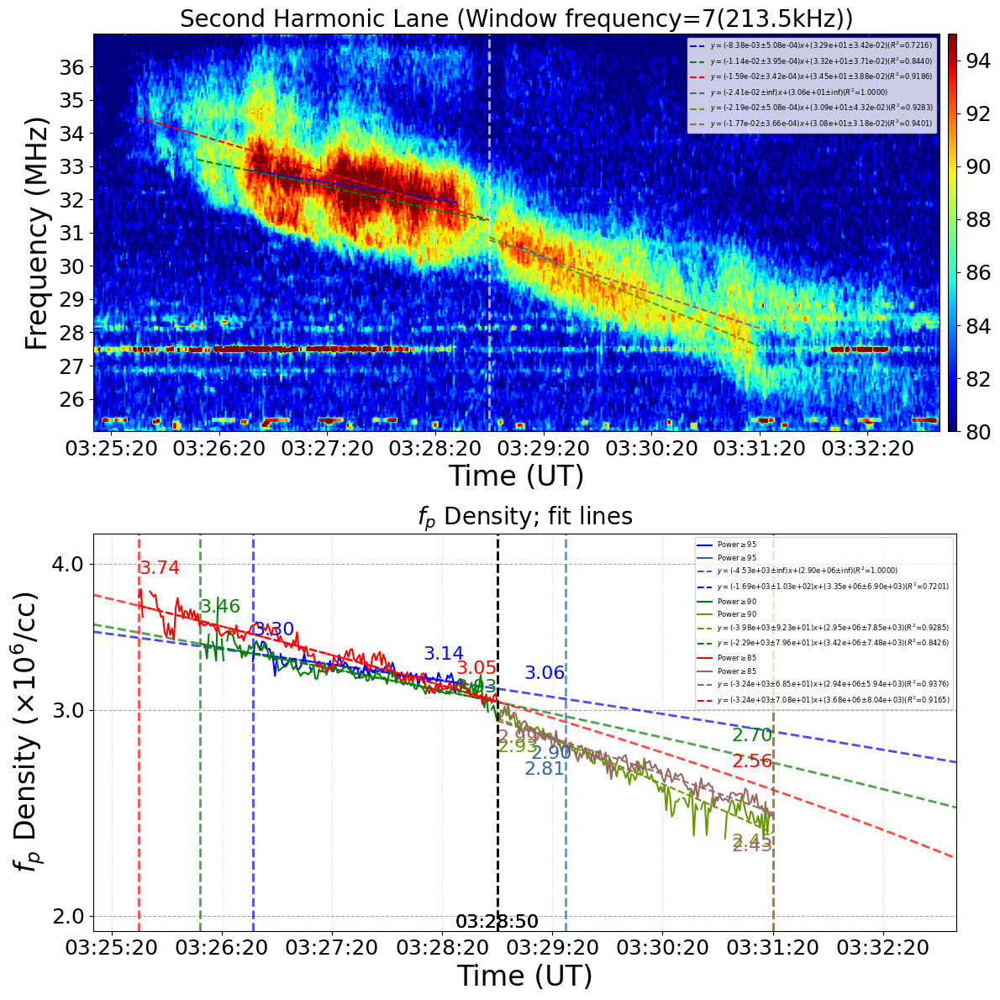

In [15]:
plot_density_from_frequency()

### グラフ4つ

In [24]:
def plot_density_from_frequency_each_threshold():
    def initial_settings(start_time, end_time, max_frequency, min_frequency, window_spectrum_frequency):
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        # Slicing data by time
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # Sliced by time
        time_sliced = time[time_mask]  # Also slice time

        # Slicing data by frequency
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # Sliced by frequency
        frequency_sliced = frequency[freq_mask]  # Also slice frequency
        frequency_sliced_mhz = frequency_sliced / 1e6  # Convert to MHz

        # Apply moving median filter along frequency axis to reduce noise
        window_time_size = 1
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_spectrum_frequency))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz

    # Spectrum settings and data
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 25e6
    window_spectrum_frequency = 7
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(
        start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum, window_spectrum_frequency
    )
    density_spectrum = density_from_frequency(frequency_sliced_mhz_spectrum)
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:10')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 37e6
    min_frequency_1 = 29e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1, window_spectrum_frequency)
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2, window_spectrum_frequency)
    
    
    
    
    ######################################################################
    ########################## ax0 ###############################################
    ##################　カラープロット ##################

    # Start plotting with subplots and log-scaled y-axes
    fig, axes = plt.subplots(2, 2, figsize=(24, 12), sharex=True)
    
    

    ################################### ax0 ##################################
    ax = axes[0, 0]  # Subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)
    
    # Color plot settings with logarithmic frequency axis
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), density_spectrum[0], density_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')
    
    cbar = plt.colorbar(img, cax=cax)
    cbar.ax.tick_params(labelsize=18)
    
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel(r'Density (${\times10^7}/cc$)', fontsize=24)
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
    
    ax.set_title(f'Second Harmonic Lane (Window frequency={window_spectrum_frequency}({window_spectrum_frequency*30.5}kHz))', fontsize=20)
    
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
    ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Minor ticks for finer control if needed

    # Custom formatter for scientific notation
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x*1e-7:.1f}"))
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))
    
    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    # y_major_locator = MultipleLocator(1)  # 周波数軸
    # ax.yaxis.set_major_locator(y_major_locator)
    
    ax.set_ylim(density_spectrum[0],density_spectrum[-1])
    
    
    
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), density_from_frequency(25), density_from_frequency(37), color='white', linewidth=2, linestyle='--', alpha=0.7)
    # ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 25, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")


    

    #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
        #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold)
    
    colors_2 = ['#336699', '#669900', '#996666']
    for threshold, color in zip(thresholds, colors_2):
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color, threshold)


    #####################################################################################



    def ax_plot_line(ax, threshold, color, color_2):
        # Convert time slices to numerical format for fitting
        time_sliced_1_num = mdates.date2num(time_sliced_1)
        time_sliced_2_num = mdates.date2num(time_sliced_2)
        
        degree = 1  # Set degree to 1 for linear fit, or change to 2 for quadratic fit

        # Data processing for 前半
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        density_from_center_frequency_1 = density_from_frequency(smoothed_frequencies_1)
        
        # Data processing for 後半
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        density_from_center_frequency_2 = density_from_frequency(smoothed_frequencies_2)

        # Plotting
        ax.plot(time_sliced_1, density_from_center_frequency_1, color=color, label=f'Power$\geq${threshold}')
        # fit_line_to_center_frequencies(ax, time_sliced_1, density_from_center_frequency_1, color, threshold)
        
        ax.plot(time_sliced_2, density_from_center_frequency_2, color=color_2, label=f'Power$\geq${threshold}')
        fit_line_to_center_frequencies(ax, time_sliced_2, density_from_center_frequency_2, color_2, threshold)

        
                # Set the time range for the plot
        ymin = density_from_frequency(frequency_sliced_mhz_spectrum[0])
        ymax = density_from_frequency(frequency_sliced_mhz_spectrum[-1])
        ax.set_ylim(ymin, ymax)
                
        # Find the first valid index and time for smoothed frequencies
        def first_and_last_valid_index_time(smoothed_frequencies, time_sliced, color):
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            first_format_time = first_valid_time.strftime('%H:%M:%S')
            
            last_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][-1]
            last_valid_time = time_sliced[last_valid_index]
            last_format_time = last_valid_time.strftime('%H:%M:%S')
            
            return first_valid_index, first_valid_time, first_format_time, last_valid_index, last_valid_time, last_format_time

        first_valid_index_1, first_valid_time_1, first_format_time_1, last_valid_index_1, last_valid_time_1, last_format_time_1 = first_and_last_valid_index_time(smoothed_frequencies_1, time_sliced_1, color)
        first_valid_index_2, first_valid_time_2, first_format_time_2, last_valid_index_2, last_valid_time_2, last_format_time_2 = first_and_last_valid_index_time(smoothed_frequencies_2, time_sliced_2, color_2)
        
        slope, intercept = fit_line_to_center_frequencies(ax, time_sliced_1, density_from_center_frequency_1, color, threshold)
        time_sliced_spectrum_num = mdates.date2num(time_sliced_spectrum)
        # delta_time = time_sliced_spectrum_num - first_valid_time_1_num
        delta_time = (pd.to_datetime(time_sliced_spectrum) - pd.to_datetime(first_valid_time_1)).total_seconds()
        
        # 1のフィットラインを全時間帯まで伸ばすプロット
        density_line_1 = slope*delta_time + intercept
        ax.plot(time_sliced_spectrum, density_line_1, color=color, linestyle='--', linewidth=2)
        
       
        # それぞれの時間におけるDensityを表示
        ax.text(mdates.date2num(first_valid_time_1), density_from_center_frequency_1[first_valid_index_1]+0.1e7, f'{density_from_center_frequency_1[first_valid_index_1]*1e-7:.2f}', color='black', fontsize=16, ha='left', va='bottom')
        ax.text(mdates.date2num(last_valid_time_1), density_from_center_frequency_1[last_valid_index_1]+0.1e7, f'{density_from_center_frequency_1[last_valid_index_1]*1e-7:.2f}', color='black', fontsize=16, ha='right', va='bottom')
        ax.text(mdates.date2num(first_valid_time_2), density_from_center_frequency_2[first_valid_index_2]-0.1e7, f'{density_from_center_frequency_2[first_valid_index_2]*1e-7:.2f}', color='black', fontsize=16, ha='left', va='top')
        ax.text(mdates.date2num(last_valid_time_2), density_from_center_frequency_2[last_valid_index_2]-0.1e7, f'{density_from_center_frequency_2[last_valid_index_2]*1e-7:.2f}', color='black', fontsize=16, ha='right', va='top')
        
        
        # 1のフィットラインを伸ばした時に，last_valid_time_2におけるDensityを表示
        density_true_value = slope*(pd.to_datetime(last_valid_time_2)-pd.to_datetime(first_valid_time_1)).total_seconds() + intercept
        ax.text(mdates.date2num(last_valid_time_2), density_true_value+0.05e7, f'{density_true_value*1e-7:.2f}', color=color, fontsize=16, ha='right', va='bottom')
        
        
        # 垂直線とそれに対応する時間を表示
        ax.vlines(mdates.date2num(first_valid_time_1), ymin, ymax, color='gray', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(first_valid_time_1), ymin, f'{first_format_time_1}', color='black', fontsize=16, ha='center', va='bottom')
        
        ax.vlines(mdates.date2num(last_valid_time_2), ymin, ymax, color='gray', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(last_valid_time_2), ymin, f'{last_format_time_2}', color='black', fontsize=16, ha='center', va='bottom')
        
        ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), ymin, ymax, color='black', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), ymin, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")

                
        
        # Setting y-axis to log scale and custom tick formatting
        ax.set_yscale('log')
        ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
        ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Minor ticks for finer control if needed

        # Custom formatter for scientific notation
        ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x*1e-7:.1f}"))

        # Additional settings
        ax.grid(True, which='both', axis='y', linestyle='--', color='gray', alpha=0.7)
        ax.grid(True, which='both', axis='x', linestyle='--', color='lightgray', alpha=0.5)
        ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
        ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
        ax.set_xlabel('Time (UT)', fontsize=24)
        ax.set_ylabel(r'Density ($\times10^7$/cc)', fontsize=24)
        ax.set_title(f'Density; fit lines (Power$\geq${threshold})', fontsize=20)
        ax.legend(loc='best', fontsize=16)

        
    
    # Repeat the same configuration for other subplots with log y-axis
    ax_plot_line(axes[0, 1], thresholds[0], colors[0], colors_2[0])

    
    ax_plot_line(axes[1, 0], thresholds[1], colors[1], colors_2[1])

    
    ax_plot_line(axes[1, 1], thresholds[2], colors[2], colors_2[2])

    # ax.set_ylim(density_from_frequency(frequency_sliced_mhz_spectrum[0]), density_from_frequency(frequency_sliced_mhz_spectrum[-1]))
    plt.tight_layout()
    plt.show()
    

Slope (MHz/s) [Power>=95]: -8.3767e-03, Intercept: 3.2875e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 5.0782e-04
Intercept standard deviation (MHz) [Power>=95]: 3.4166e-02 

Slope (MHz/s) [Power>=90]: -1.1405e-02, Intercept: 3.3198e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 3.9505e-04
Intercept standard deviation (MHz) [Power>=90]: 3.7139e-02 

Slope (MHz/s) [Power>=85]: -1.5862e-02, Intercept: 3.4474e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 3.4158e-04
Intercept standard deviation (MHz) [Power>=85]: 3.8803e-02 

Slope (MHz/s) [Power>=95]: -2.4093e-02, Intercept: 3.0563e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

Slope (MHz/s) [Power>=90]: -2.1885e-02, Intercept: 3.0868e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 5.0850e-04
Intercept standard deviation (MHz) [Power>=90]: 4.3216e-02 

Slope (MHz/s) [Power>=85]: -1.7706e-02, Intercept: 3.0781e+01 MHz
Slope standard deviation (MH

/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


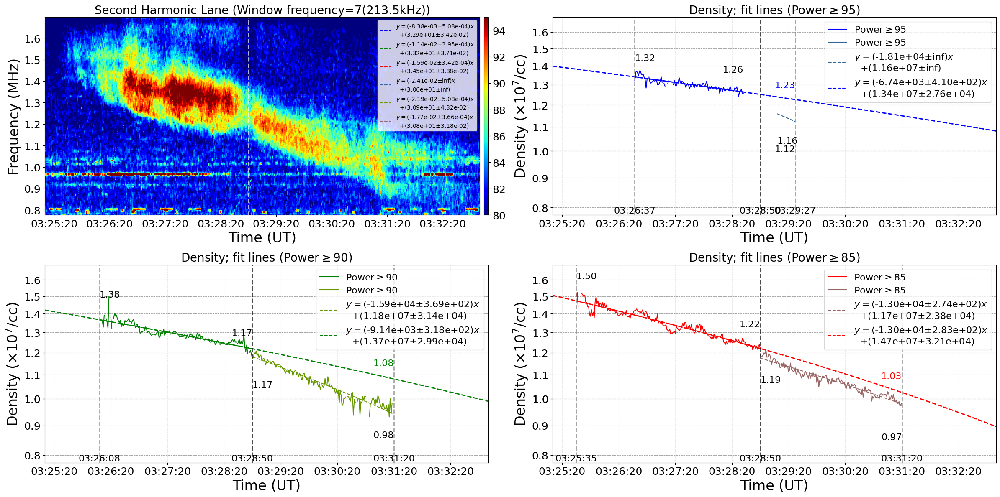

In [25]:
plot_density_from_frequency_each_threshold()

## Density vs rho

### constant speed

In [32]:
def plot_density_vs_rho_at_constant_speed_each_threshold(velocity_constant):
    def initial_settings(start_time, end_time, max_frequency, min_frequency, window_spectrum_frequency):
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        # Slicing data by time
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # Sliced by time
        time_sliced = time[time_mask]  # Also slice time

        # Slicing data by frequency
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # Sliced by frequency
        frequency_sliced = frequency[freq_mask]  # Also slice frequency
        frequency_sliced_mhz = frequency_sliced / 1e6  # Convert to MHz

        # Apply moving median filter along frequency axis to reduce noise
        window_time_size = 1
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_spectrum_frequency))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz
    

    # Spectrum settings and data
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 25e6
    window_spectrum_frequency = 7
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(
        start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum, window_spectrum_frequency
    )
    
    # min_length_spectrum = min(len(time_sliced_spectrum), len(filtered_lh_data_spectrum))
    # time_sliced_spectrum = time_sliced_spectrum[:min_length_spectrum]
    # filtered_lh_data_spectrum = filtered_lh_data_spectrum[:min_length_spectrum]
    
    # valid_indices = ~np.isnan(frequency_sliced_mhz_spectrum) & np.isfinite(frequency_sliced_mhz_spectrum)  # NaNやInfを取り除く
    # time_sliced_spectrum = time_sliced_spectrum[valid_indices]
    density_spectrum = density_from_frequency(frequency_sliced_mhz_spectrum)

    
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:10')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 37e6
    min_frequency_1 = 29e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1, window_spectrum_frequency)
    
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2, window_spectrum_frequency)
    
    
    
    ######################################################################
    ########################## ax0 ###############################################
    ##################　カラープロット ##################

    # Start plotting with subplots and log-scaled y-axes
    fig, axes = plt.subplots(2, 2, figsize=(24, 12), sharex=True)
    colors_2 = ['#336699', '#669900', '#996666']
    
    ################################### ax0 ##################################
    ax = axes[0, 0]  # Subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)
    
    # Color plot settings with logarithmic frequency axis
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), density_spectrum[0], density_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')
    
    cbar = plt.colorbar(img, cax=cax)
    cbar.ax.tick_params(labelsize=18)
    
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel(r'Density (${\times10^7}/cc$)', fontsize=24)
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
    
    ax.set_title(f'Second Harmonic Lane (Window frequency={window_spectrum_frequency}({window_spectrum_frequency*30.5}kHz))', fontsize=20)
    
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
    ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Minor ticks for finer control if needed

    # Custom formatter for scientific notation
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x*1e-7:.1f}"))
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))
    
    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    # y_major_locator = MultipleLocator(1)  # 周波数軸
    # ax.yaxis.set_major_locator(y_major_locator)
    
    ax.set_ylim(density_spectrum[0],density_spectrum[-1])
    
    
    
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), density_from_frequency(25), density_from_frequency(37), color='white', linewidth=2, linestyle='--', alpha=0.7)
    
    
    # ax.vlines(rho_0_spectrum + (pd.to_datetime(np.datetime64("2022-06-13T03:28:50")) - pd.to_datetime(time_sliced[0])).total_seconds() * velocity_constant / R_sun, 25, 37, color='white', linewidth=2, linestyle='--', alpha=0.7)
    # ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 25, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")


    

    #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
        #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
    def density_values_calculation(ax, threshold, color, color_2):
        density_values_dict_1 = {}
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        
        density_values_dict_1[threshold] = density_from_frequency(smoothed_frequencies_1)
        
        density_title = f'Density; fit lines (Power$\geq${threshold})'
        plot_density_time_evolution(ax, time_sliced_1, density_values_dict_1[threshold], threshold, color, density_title)
                    
        
        density_values_dict_2 = {}
        colors_2 = ['#336699', '#669900', '#996666']
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        
        density_values_dict_2[threshold] = density_from_frequency(smoothed_frequencies_2)
        
        density_title_2 = f'Density; fit lines (Power$\geq${threshold})'
        plot_density_time_evolution(ax, time_sliced_2, density_values_dict_2[threshold], threshold, color, density_title_2)
        
        

    density_values_calculation(axes[0, 1], thresholds[0], colors[0], colors_2[0])
    density_values_calculation(axes[1, 0], thresholds[1], colors[1], colors_2[1])
    density_values_calculation(axes[1, 1], thresholds[2], colors[2], colors_2[2])
    ################



        
    

    # ax.set_ylim(density_from_frequency(frequency_sliced_mhz_spectrum[0]), density_from_frequency(frequency_sliced_mhz_spectrum[-1]))
    plt.tight_layout()
    plt.show()
    

◎ 密度の計算 ◎


ValueError: Multi-dimensional indexing (e.g. `obj[:, None]`) is no longer supported. Convert to a numpy array before indexing instead.

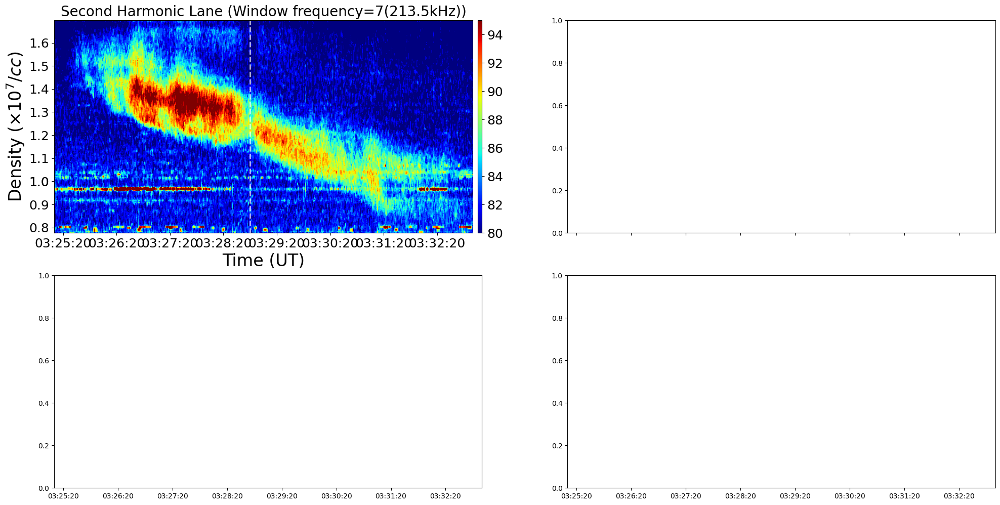

In [33]:
plot_density_vs_rho_at_constant_speed_each_threshold(velocity_constant=200)

## Delta Density / Density

In [ ]:
def plot_density_ratio_each_threshold():
    def initial_settings(start_time, end_time, max_frequency, min_frequency, window_spectrum_frequency):
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        # Slicing data by time
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # Sliced by time
        time_sliced = time[time_mask]  # Also slice time

        # Slicing data by frequency
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # Sliced by frequency
        frequency_sliced = frequency[freq_mask]  # Also slice frequency
        frequency_sliced_mhz = frequency_sliced / 1e6  # Convert to MHz

        # Apply moving median filter along frequency axis to reduce noise
        window_time_size = 1
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_spectrum_frequency))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz

    # Spectrum settings and data
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 25e6
    window_spectrum_frequency = 7
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(
        start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum, window_spectrum_frequency
    )
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:10')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 37e6
    min_frequency_1 = 29e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1, window_spectrum_frequency)
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2, window_spectrum_frequency)
    
    
    
    
    ######################################################################
    ########################## ax0 ###############################################
    ##################　カラープロット ##################

    # Start plotting with subplots and log-scaled y-axes
    fig, axes = plt.subplots(2, 2, figsize=(24, 12), sharex=True)
    
    

    ################################### ax0 ##################################
    ax = axes[0, 0]  # Subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)
    
    # Color plot settings with logarithmic frequency axis
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')
    
    cbar = plt.colorbar(img, cax=cax)
    cbar.ax.tick_params(labelsize=18)
    
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
    
    ax.set_title(f'Second Harmonic Lane (Window frequency={window_spectrum_frequency}({window_spectrum_frequency*30.5}kHz))', fontsize=20)
    
    ax.set_yscale('log')  # Set frequency axis to log scale
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs='auto'))
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):d}" if x >= 10 else ""))  # Modified for 2-digit integer labels
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))
    
        # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    y_major_locator = MultipleLocator(1)  # 周波数軸
    ax.yaxis.set_major_locator(y_major_locator)
    
    ax.set_ylim(frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1])
    
    
    
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 25, 37, color='white', linewidth=2, linestyle='--', alpha=0.7)
    # ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 25, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")


    

    #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
    
    colors_2 = ['#336699', '#669900', '#996666']


    #####################################################################################



    def ax_plot_line(ax, threshold, color, color_2):
        # Convert time slices to numerical format for fitting
        time_sliced_1_num = mdates.date2num(time_sliced_1)
        time_sliced_2_num = mdates.date2num(time_sliced_2)
        
        degree = 1  # Set degree to 1 for linear fit, or change to 2 for quadratic fit

        # Data processing for 前半
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        density_from_center_frequency_1 = density_from_frequency(smoothed_frequencies_1)
        
        # Data processing for 後半
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        density_from_center_frequency_2 = density_from_frequency(smoothed_frequencies_2)

        # Plotting
        ax.plot(time_sliced_1, density_from_center_frequency_1, color=color, label=f'Power$\geq${threshold}')
        fit_line_to_center_frequencies(ax, time_sliced_1, density_from_center_frequency_1, color, threshold)
        ax.plot(time_sliced_2, density_from_center_frequency_2, color=color_2, label=f'Power$\geq${threshold}')
        fit_line_to_center_frequencies(ax, time_sliced_2, density_from_center_frequency_2, color_2, threshold)

        
                # Set the time range for the plot
        ymin = density_from_frequency(frequency_sliced_mhz_spectrum[0])
        ymax = density_from_frequency(frequency_sliced_mhz_spectrum[-1])
        ax.set_ylim(ymin, ymax)
                
        # Find the first valid index and time for smoothed frequencies
        def first_and_last_valid_index_time(smoothed_frequencies, time_sliced, color):
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            first_format_time = first_valid_time.strftime('%H:%M:%S')
            
            last_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][-1]
            last_valid_time = time_sliced[last_valid_index]
            last_format_time = last_valid_time.strftime('%H:%M:%S')
            
            return first_valid_index, first_valid_time, first_format_time, last_valid_index, last_valid_time, last_format_time

        first_valid_index_1, first_valid_time_1, first_format_time_1, last_valid_index_1, last_valid_time_1, last_format_time_1 = first_and_last_valid_index_time(smoothed_frequencies_1, time_sliced_1, color)
        first_valid_index_2, first_valid_time_2, first_format_time_2, last_valid_index_2, last_valid_time_2, last_format_time_2 = first_and_last_valid_index_time(smoothed_frequencies_2, time_sliced_2, color_2)
        
        ax.text(mdates.date2num(first_valid_time_1), density_from_center_frequency_1[first_valid_index_1]+0.1e7, f'{density_from_center_frequency_1[first_valid_index_1]*1e-7:.2f}', color='black', fontsize=16, ha='left', va='bottom')
        ax.text(mdates.date2num(last_valid_time_1), density_from_center_frequency_1[last_valid_index_1]+0.1e7, f'{density_from_center_frequency_1[last_valid_index_1]*1e-7:.2f}', color='black', fontsize=16, ha='right', va='bottom')
        ax.text(mdates.date2num(first_valid_time_2), density_from_center_frequency_2[first_valid_index_2]-0.1e7, f'{density_from_center_frequency_2[first_valid_index_2]*1e-7:.2f}', color='black', fontsize=16, ha='left', va='top')
        ax.text(mdates.date2num(last_valid_time_2), density_from_center_frequency_2[last_valid_index_2]-0.1e7, f'{density_from_center_frequency_2[last_valid_index_2]*1e-7:.2f}', color='black', fontsize=16, ha='right', va='top')
        
        ax.vlines(mdates.date2num(first_valid_time_1), ymin, ymax, color='black', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(first_valid_time_1), ymin, f'{first_format_time_1}', color='black', fontsize=16, ha='center', va='bottom')
        
        ax.vlines(mdates.date2num(last_valid_time_2), ymin, ymax, color=color, linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(last_valid_time_2), ymin, f'{last_format_time_2}', color='black', fontsize=16, ha='center', va='bottom')
        
        ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), ymin, ymax, color='black', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), ymin, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")

                
        
        # Setting y-axis to log scale and custom tick formatting
        ax.set_yscale('log')
        ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
        ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 17) * 1e-1))  # Minor ticks for finer control if needed

        # Custom formatter for scientific notation
        ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x*1e-7:.1f}"))

        # Additional settings
        ax.grid(True, which='both', axis='y', linestyle='--', color='gray', alpha=0.7)
        ax.grid(True, which='both', axis='x', linestyle='--', color='lightgray', alpha=0.5)
        ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
        ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
        ax.set_xlabel('Time (UT)', fontsize=24)
        ax.set_ylabel(r'Density ($\times10^7$/cc)', fontsize=24)
        ax.set_title(f'Density; fit lines (Power$\geq${threshold})', fontsize=20)
        ax.legend(loc='best', fontsize=16)

        
    
    # Repeat the same configuration for other subplots with log y-axis
    ax_plot_line(axes[0, 1], thresholds[0], colors[0], colors_2[0])

    
    ax_plot_line(axes[1, 0], thresholds[1], colors[1], colors_2[1])

    
    ax_plot_line(axes[1, 1], thresholds[2], colors[2], colors_2[2])

    # ax.set_ylim(density_from_frequency(frequency_sliced_mhz_spectrum[0]), density_from_frequency(frequency_sliced_mhz_spectrum[-1]))
    plt.tight_layout()
    plt.show()
    

# inverse frequency

In [112]:
vmin=80
vmax=95
def plot_inverse_frequency_data():
    # 周波数をHzからMHzに変換
    start_frequency = 25e6

    end_frequency = 37e6

    start_time = np.datetime64('2022-06-13T03:25:10')
    end_time = np.datetime64('2022-06-13T03:33:00')
    
    time_interval = 60*2
    frequency_interval = 1
    
    title = 'Emission Lane (1) (1/f - time)'
    window_frequency_size = 1

    #####################スライス#############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
    time_sliced = time[time_mask]  # 時間もスライス

    # 周波数範囲でデータをスライス
    inverse_frequency = 1 / frequency
    freq_mask = (inverse_frequency >= 1/end_frequency) & (inverse_frequency <= 1/start_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    frequency_sliced = inverse_frequency[freq_mask]  # 周波数もスライス
    frequency_sliced_mhz = frequency_sliced / 1e-6  # MHzに変換

    # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
    window_time_size = 1
    filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

    ##########################カラープロットの作成##################################
    fig, ax = plt.subplots(figsize=(12, 6))

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    # cbar.set_label(r'Power (dB)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('1/f', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)

    ax.set_title(title, fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))  # 60秒ごとに目盛りを追加
    y_major_locator = MultipleLocator(1/500)  # 1MHzごとに目盛を追加
    ax.yaxis.set_major_locator(y_major_locator)
    # ax.set_yscale('log')
    # y軸を反転
    ax.invert_yaxis()

    # レイアウトの調整
    plt.tight_layout()
    plt.show()

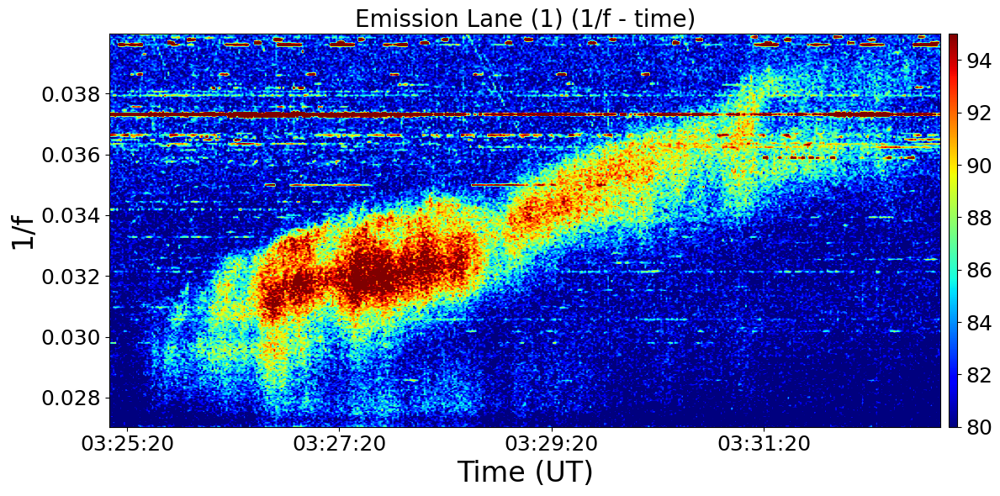

In [113]:
plot_inverse_frequency_data()  

# 強度パスフィルター

In [11]:
def power_pass_filter(ax, threshold_noise_max, threshold_noise_min):    
    window_time_size = 1
    window_frequency_size = 7
    
    def initial_settings(start_time, end_time, max_frequency, min_frequency):
        
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        ##################### スライス #############################
        # 時間範囲でデータをスライス
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
        time_sliced = time[time_mask]  # 時間もスライス

        # 周波数範囲でデータをスライス
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
        frequency_sliced = frequency[freq_mask]  # 周波数もスライス
        frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

        # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
                # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
        
        
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz
    
    
    ########################################################################
    ################## スペクトル ##################
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 26e6
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum)    

    ##### カラーバーの範囲を指定
    vmin = 80
    vmax = 95

    # Set the threshold for the power flux density
    # Apply the threshold to the sliced data
    filtered_lh_data_spectrum = np.where(threshold_noise_min <= filtered_lh_data_spectrum, filtered_lh_data_spectrum, np.nan) # & np.where(lh_data_sliced <= threshold_noise_min, lh_data_sliced, np.nan) 
    


    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power (dB)', fontsize=16)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    # ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)
    ax.set_title(f'Second Harmonic Lane (Power$\geq${threshold_noise_min})', fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    ax.set_yscale('log')
    ax.yaxis.set_major_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Major ticks at 0.1, 0.2, ... up to 0.9 in each power of 10
    ax.yaxis.set_minor_locator(mticker.LogLocator(base=10.0, subs=np.arange(1, 10) * 1e-1))  # Minor ticks for finer control if needed
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.2g}"))
    ax.set_ylim(frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1])
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 26, 37, color='gray', linewidth=2, linestyle='--', alpha=0.7)
    ax.text(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 26, '03:28:50', color='black', fontsize=16, ha='center', va='top')
    


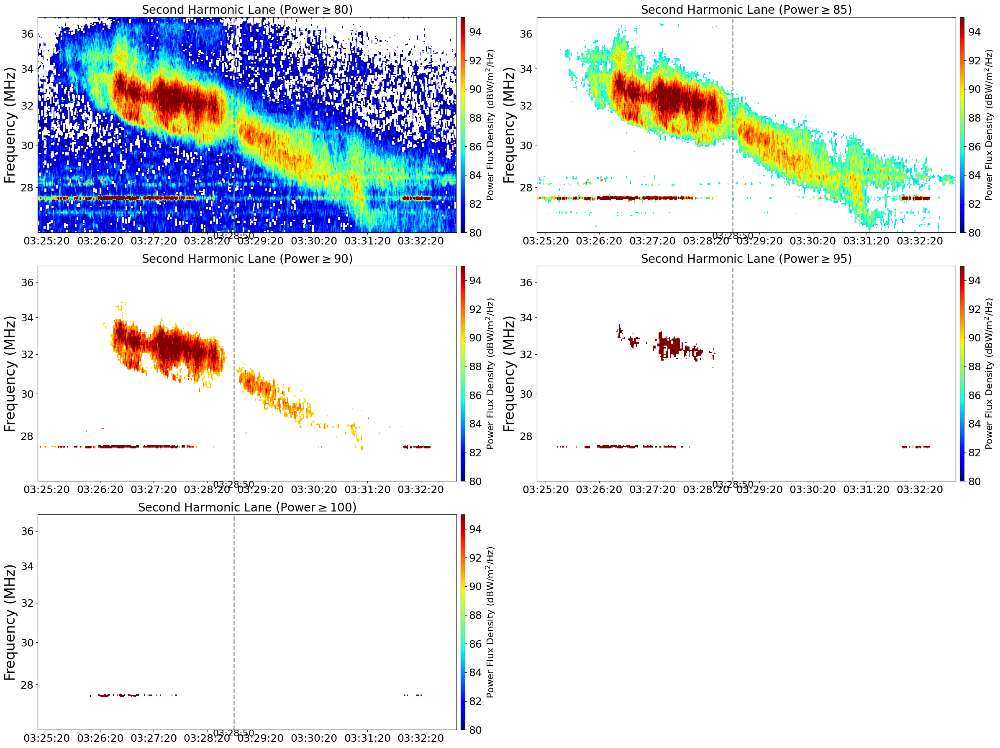

In [12]:
fig, axes = plt.subplots(3, 2, figsize=(24, 18), tight_layout=True)

threshold_noise_max = 105
threshold_noise_min_values = [80, 85, 90, 95, 100]

for ax, threshold_noise_min in zip(axes.flat, threshold_noise_min_values):  # Use axes.flat to iterate
    power_pass_filter(ax, threshold_noise_max, threshold_noise_min)

axes.flat[-1].axis('off')  # Hide the last unused subplot
plt.show()


# メモ

In [ ]:
# # median_filterを適用する
# def smoothed_center_frequencies(center_frequencies, window_size):
#     """
#     平滑化された中心周波数を計算する関数。メディアンフィルタを適用する。
    
#     Parameters:
#     center_frequencies (ndarray): 計算された中心周波数
#     window_size (int): メディアンフィルタのウィンドウサイズ
    
#     Returns:
#     ndarray: 平滑化された中心周波数
#     """
#     # 平滑化前にNaNを適切に扱う
#     center_frequencies_series = pd.Series(center_frequencies)
    
#     # numpy配列に変換
#     center_frequencies_np = center_frequencies_series.to_numpy()
    
#     # NaNを一時的に埋める（median_filterはNaNを扱えないため）
#     if np.isnan(center_frequencies_np).all():
#         # すべてのデータがNaNの場合、NaNのまま返す
#         return center_frequencies_np
#     else:
#         # NaNを無視して平均を計算
#         center_frequencies_np_nonan = np.nan_to_num(center_frequencies_np, nan=np.nanmean(center_frequencies_np))
    
#     # median_filterを使って移動中央値を計算
#     smoothed = median_filter(center_frequencies_np_nonan, size=window_size)
    
#     # もとのNaN部分を復元
#     smoothed = np.where(np.isnan(center_frequencies_np), np.nan, smoothed)
    
#     return smoothed

# 指数移動平均を適用する
# def smoothed_center_frequencies(center_frequencies, window_size):
#         # numpy.ndarray を pandas.Series に変換
#     center_frequencies_series = pd.Series(center_frequencies)
    
#     # 指数移動平均 (Exponential Moving Average) を計算
#     smoothed = center_frequencies_series.ewm(span=window_size, adjust=False).mean()
    
#     # numpy.ndarray に戻して返す
#     return smoothed.to_numpy()

# # gaussian_filterを適用する
# from scipy.ndimage import gaussian_filter

# def smoothed_center_frequencies(center_frequencies, window_size):
#     # numpy.ndarray を pandas.Series に変換
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
#     smoothed = gaussian_filter(center_frequencies_filled, sigma=window_size)
#     return smoothed


# # Savitzky-Golayフィルタを適用する
# from scipy.signal import savgol_filter
# def smoothed_center_frequencies(center_frequencies, window_size):
#     # numpy.ndarray を pandas.Series に変換
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
#     smoothed = savgol_filter(center_frequencies_filled, window_length=window_size, polyorder=2)
#     return smoothed

# # # バターワースフィルタを適用する
# from scipy.signal import butter, filtfilt
# def smoothed_center_frequencies(center_frequencies, window_size):
#     # バターワースフィルタの設計
#     b, a = butter(N=3, Wn=0.05)
    
#     # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # バターワースフィルタを適用
#     smoothed = filtfilt(b, a, center_frequencies_filled)
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed

# スプライン補間を適用する
# from scipy.interpolate import UnivariateSpline
# def smoothed_center_frequencies(center_frequencies, window_size):
#         # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # スプライン補間を適用
#     spline = UnivariateSpline(np.arange(len(center_frequencies_filled)), center_frequencies_filled, s=window_size)
#     smoothed = spline(np.arange(len(center_frequencies_filled)))
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed

# Kalmanフィルタを適用する
# import pykalman
# from pykalman import KalmanFilter
# def smoothed_center_frequencies(center_frequencies, window_size):
#         # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # カリマンフィルタのセットアップ
#     kf = KalmanFilter(initial_state_mean=center_frequencies_filled[0], n_dim_obs=1)
    
#     # カリマンフィルタによる平滑化
#     smoothed_state_means, _ = kf.smooth(center_frequencies_filled)
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed_state_means[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed_state_means.flatten()

# # ウェーブレット変換を適用する
# import pywt
# def smoothed_center_frequencies(center_frequencies, window_size):
#        # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # ウェーブレット変換としきい値処理
#     coeff = pywt.wavedec(center_frequencies_filled, 'db3', level=3)
#     coeff[1:] = [pywt.threshold(i, value=0.5, mode='hard') for i in coeff[1:]]
    
#     # ウェーブレット逆変換
#     smoothed = pywt.waverec(coeff, 'db3')
    
#     # 元のデータの長さに一致させる
#     smoothed = smoothed[:len(center_frequencies_filled)]
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed

In [ ]:
# Nanでも配列に入れる場合(配列の長さが変わらない)
# def remove_outliers(data, threshold=3.0):
#     mean = np.nanmean(data)
#     std = np.nanstd(data)
#     z_scores = np.abs((data - mean) / std)
    
#     # 閾値を超えたデータをNaNにする
#     filtered_data = np.where(z_scores > threshold, np.nan, data)
    
#     return filtered_data

In [ ]:
# # ドリフトレートを計算する関数(外れ値あり)
# def calculate_drift_rate(center_frequencies, time_sliced):
#     """
#     中心周波数のドリフトレートを計算し、外れ値を除去します。
#     """
#     valid_indices = ~np.isnan(center_frequencies[:-1])
#     time_sliced_valid = time_sliced[:-1][valid_indices]
#     center_frequencies_valid = center_frequencies[:-1][valid_indices]

#     # 周波数差分と時間差分を計算
#     freq_diff = np.diff(center_frequencies_valid)
#     time_diff = np.diff(time_sliced_valid.values).astype('timedelta64[ms]').astype(float) / 1000.0

#     # 外れ値を除去
#     freq_diff_no_outliers = remove_outliers(freq_diff)
#     time_diff_no_outliers = time_diff[:len(freq_diff_no_outliers)]

#     # ドリフトレートを計算
#     freq_rate = freq_diff / time_diff
    
#     ave_freq_rate = np.mean(freq_rate)
    
#     return freq_rate

start_frequency =  25000000.0
end_frequency = 37000000.0



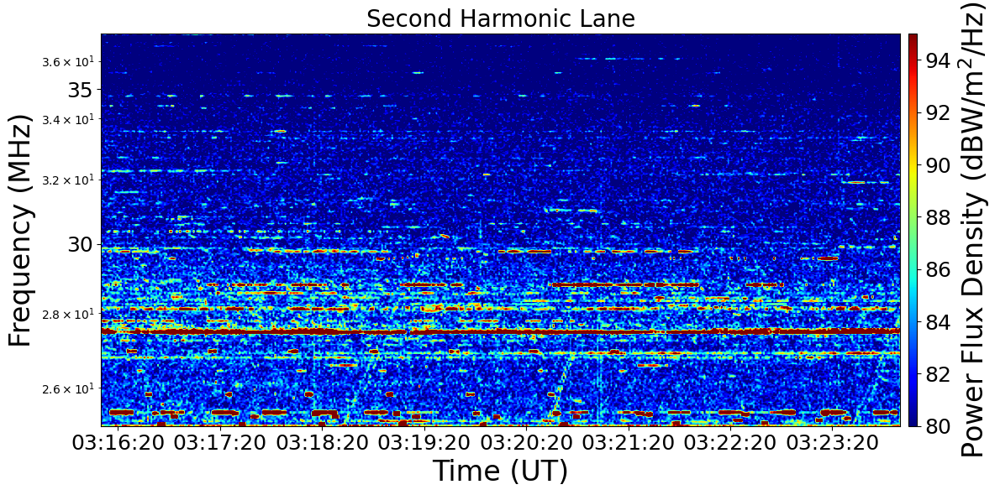

In [4]:
vmin=80
vmax=95
plot_filtered_lh_data(start_time=np.datetime64('2022-06-13T03:16:10'),
    end_time=np.datetime64('2022-06-13T03:24:00'),
    title='Second Harmonic Lane',
    time_interval=60*1,
    frequency_interval=5,
    window_frequency_size=1
    )

In [ ]:
import numpy as np



def normalize_lh_data(lh_data_sliced_1, lh_data_sliced_2):
    """
    lh_data_sliced_1 を lh_data_sliced_2 の周波数方向平均値で規格化する
    """
    def obtain_power_of_frequency_average(lh_data_sliced):
        """
        周波数帯のパワーの平均値（時間軸方向）を計算する関数
        """
        return np.mean(lh_data_sliced, axis=0)
    
    # 周波数帯平均値を計算
    power_average = obtain_power_of_frequency_average(lh_data_sliced_2)

    # 規格化: 対応する周波数帯平均値で割る
    normalized_data = lh_data_sliced_1 / power_average

    return normalized_data

# データ例
lh_data_sliced_1 = np.array([[0, 1, 2, 3], [4, 5, 6, 7], [8, 9, 10, 11]])
lh_data_sliced_2 = np.array([[11, 10, 9, 8], [7, 6, 5, 4], [3, 2, 1, 0]])

# 規格化処理
normalized_lh_data = normalize_lh_data(lh_data_sliced_1, lh_data_sliced_2)

# 結果表示
print("Normalized LH Data:")
print(normalized_lh_data)


Normalized LH Data:
[[0.         0.16666667 0.4        0.75      ]
 [0.57142857 0.83333333 1.2        1.75      ]
 [1.14285714 1.5        2.         2.75      ]]
